# The modelling error is:
$$\delta e_{sys} = (e-e_{PSF}) \left( \frac{T_{PSF}}{T_{gal}} \right) \frac{\delta T_{PSF}}{T_{PSF}} - \left( \frac{T_{PSF}}{T_{gal}} \right)\delta e_{PSF}$$


## Propagate into shear errors:
$\rho$ statistics:

$$\rho_1 = \left\langle \delta e_{PSF}^*(x) \; \delta e_{PSF} (x+\theta) \right\rangle$$

$$\rho_2 = \left\langle e_{PSF}^* (x) \; \delta e_{PSF} (x+\theta) \right\rangle $$
$$\rho_3 = \left\langle \left( e_{PSF}^*   \frac{\delta T_{PSF}}{T_{PSF}}\right)(x) \; \left(e_{PSF}   \frac{\delta T_{PSF}}{T_{PSF}}\right)(x+\theta)\right\rangle $$
$$\rho_4 = \left\langle \delta e_{PSF}^* (x)\;\left( e_{PSF} \frac{\delta T_{PSF}}{T_{PSF}}\right)(x+\theta)\right\rangle $$
$$\rho_5 = \left\langle e_{PSF}^* (x)\; \left(e_{PSF} \frac{\delta T_{PSF}}{T_{PSF}}\right)(x+\theta) \right\rangle $$

Then

$$\delta \xi_+ (\theta) = 2 \left\langle \frac{T_{PSF}}{T_{gal}} \frac{\delta T_{PSF}}{T_{PSF}} \right\rangle \xi_+(\theta)
 + \left\langle \frac{T_{PSF}}{T_{gal}} \right\rangle^2 \rho_1(\theta)
 - \alpha\left\langle\frac{T_{PSF}}{T_{gal}}\right\rangle \rho_2(\theta) 
 + \left\langle \frac{T_{PSF}}{T_{gal}} \right\rangle^2 \rho_3(\theta)
 + \left\langle \frac{T_{PSF}}{T_{gal}} \right\rangle^2 \rho_4(\theta)
 - \alpha\left\langle\frac{T_{PSF}}{T_{gal}}\right\rangle \rho_5(\theta) 
$$

In [106]:
from __future__ import division
%pylab inline
from scipy import stats
from angles import r2d, r2arcs, d2arcs, arcs2r
def arcm2r(theta):
    return arcs2r(theta*60)
import seaborn as sns;sns.set_style('darkgrid')
import lsst.sims.maf.stackers as stackers
import treecorr as tr
%config InlineBackend.figure_format = 'retina'
matplotlib.rcParams['figure.figsize'] = 19,14
import lsst.sims.maf.slicers as slicers
import lsst.sims.maf.metrics as metrics
import lsst.sims.maf.metricBundles as metricBundles
import lsst.sims.maf.db as db
from collections import defaultdict
import treecorr
from itertools import chain
sns.set_context('poster',font_scale=1.4)

Populating the interactive namespace from numpy and matplotlib


/global/common/software/lsst/common/miniconda/py3-4.2.12/lib/python3.6/site-packages/IPython/core/magics/pylab.py:160: UserWarning: pylab import has clobbered these variables: ['hist']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"
/global/common/software/lsst/common/miniconda/py3-4.2.12/lib/python3.6/site-packages/IPython/html.py:14: ShimWarning: The `IPython.html` package has been deprecated since IPython 4.0. You should import from `notebook` instead. `IPython.html.widgets` has moved to `ipywidgets`.
  "`IPython.html.widgets` has moved to `ipywidgets`.", ShimWarning)


In [2]:
def ditherplot(obj, statistic='median',**kwargs):
    if 'DELTA' in str(obj):
        title = 'median residual elipticity: {:.5f}'
    elif 'STAR in str(obj)':
        title = 'median star elipticity : {:.5f}'
    else:
        raise NameError('''obj should have STAR or DELTA.''')
    X = np.array(list(obj.e.keys()))[:,0]
    Y = np.array(list(obj.e.keys()))[:,1]
    e1 = np.array(list(obj.e.values()))[:,0]
    e2 = np.array(list(obj.e.values()))[:,1]
    lengths = np.sqrt(e1**2+e2**2)
    angles = np.array([r2d(0.5*np.arctan2(ei2,ei1)) for ei1,ei2 in zip(e1,e2)])
    pixel_scale = r2d(1)
    U = lengths*np.cos(angles)
    V = lengths*np.sin(angles)
    Q = plt.quiver(pixel_scale*X,Y*pixel_scale,U,V,angles=angles,
                   headlength=0,headaxislength=0,units='height',**kwargs);
    plt.xlabel('RA (degrees)')
    plt.ylabel('dec (degrees)')
    if statistic=='median':
        plt.title(title.format(np.median(lengths)))
    elif statistic=='mean':
        title.replace('median','mean')
        plt.title(title.format(np.mean(lengths)))

In [3]:
import seaborn
def corrplot(r, xi, sigma=np.array([None]),color='b',scale='log'):
    if sigma.all()!=None:
#         def _plot_std_bars(std=None, central_data=None, ci=None, data=None,*args, **kwargs):
#             std = sigma
#             ci = np.asarray((central_data - std, central_data + std))
#             kwargs.update({"central_data": central_data, "ci": ci, "data": data})
#             seaborn.timeseries._plot_ci_band(*args, **kwargs)
#         seaborn.timeseries._plot_std_bars = _plot_std_bars
        ax = sns.tsplot(xi,r,color=color, n_boot=0)
        ax.errorbar(r, xi, yerr=sigma, fmt=None,color=color)


    else:
        sns.tsplot(xi,r,color=color)
    plt.xlabel(r'$\theta$ (degrees)')
    # plt.ylabel(r'$\xi_+$')
    plt.xscale('log')
    plt.yscale(scale)


# Dither patterns available to use:
    - fieldRA                     | fieldDec
    - hexDitherFieldPerNightRa    | hexDitherFieldPerNightDec
    - hexDitherFieldPerVisitRa    | hexDitherFieldPerVisitDec
    - randomDitherFieldPerNightRa | randomDitherFieldPerNightDec
    - randomDitherFieldPerVisitRa | randomDitherFieldPerVisitDec
    - spiralDitherFieldPerNightRa | spiralDitherFieldPerNightDec
    - spiralDitherFieldPerVisitRa | spiralDitherFieldPerVisitDec
    
The methods should be called with 'pattern_timescale', e.g. 'random_night'

###  Plots of the dither patterns:

The new alt_scheduler

Healpix slicer using NSIDE=128, approximate resolution 27.483891 arcminutes
Querying database SummaryAllProps with constraint filter = "r" and night < 3000 for columns ['observationStartMJD', 'fieldDec', 'fieldRA']
Found 411057 visits
Running:  ['field dither']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.


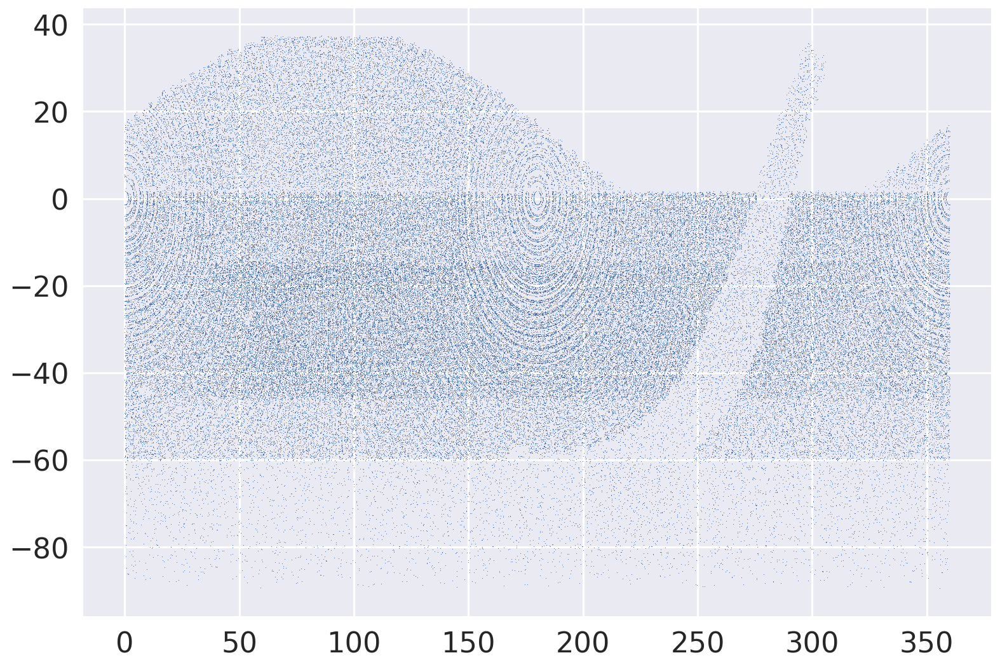

In [21]:
runName = '/global/homes/h/husni/lsstpsf/simruns/feature_rolling_half_mask_10yrs'
opsdb = db.OpsimDatabase(runName+'.db')
outDir = 'dither_test'
resultsDb = db.ResultsDb(outDir=outDir)
nside = 128 
myBundles = {}
metric = metrics.CountMetric('observationStartMJD')
sqlconstraint = 'filter = "r" and night < 3000'
stackerList = []
slicer3 = slicers.HealpixSlicer(lonCol='fieldRA', latCol='fieldDec', nside=nside)
myBundles['field dither'] = metricBundles.MetricBundle(metric, slicer3, constraint=sqlconstraint, 
                                                       stackerList=stackerList, runName=runName,
                                                       metadata='field dither')
bgroup = metricBundles.MetricBundleGroup(myBundles, opsdb, outDir=outDir, resultsDb=resultsDb)
bgroup.runAll() 
plt.plot(bgroup.simData['fieldRA'],bgroup.simData['fieldDec'],',')

In [22]:
runName = '/global/homes/h/husni/lsstpsf/simruns/alt_sched'
opsdb = db.OpsimDatabase(runName+'.db')
outDir = 'dither_test'
resultsDb = db.ResultsDb(outDir=outDir)
nside = 128 
myBundles = {}
metric = metrics.CountMetric('observationStartMJD')
sqlconstraint = 'filter = "r"'
stackerList = []
slicer3 = slicers.HealpixSlicer(lonCol='fieldRA', latCol='fieldDec', nside=nside)
myBundles['field dither'] = metricBundles.MetricBundle(metric, slicer3, constraint='', 
                                                       stackerList=stackerList, runName=runName,
                                                       metadata='field dither')
bgroup = metricBundles.MetricBundleGroup(myBundles, opsdb, outDir=outDir, resultsDb=resultsDb)
bgroup.runAll() 

Healpix slicer using NSIDE=128, approximate resolution 27.483891 arcminutes
Querying database SummaryAllProps with no constraint for columns ['observationStartMJD', 'fieldDec', 'fieldRA'].
Found 2047708 visits
Running:  ['field dither']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.


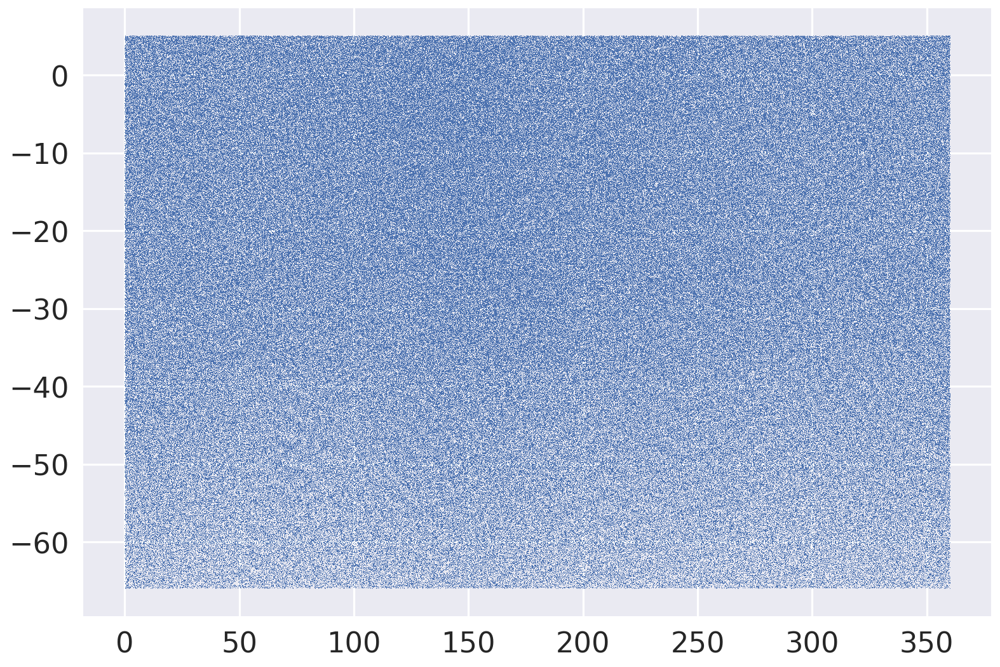

In [23]:
plt.plot(bgroup.simData['fieldRA'],bgroup.simData['fieldDec'],',')

In [24]:
runName = '/global/homes/h/husni/lsstpsf/simruns/minion_1012'
opsdb = db.OpsimDatabase(runName + '_sqlite.db')
outDir = 'dither_test'
resultsDb = db.ResultsDb(outDir=outDir)
slicer = slicers.HealpixSlicer(nside=64, lonCol='randomDitherFieldPerNightRa', latCol='randomDitherFieldPerNightDec')#, degrees=False)
metric = metrics.CountMetric(col='expMJD')
stackerList = [stackers.RandomDitherFieldPerNightStacker(fieldIdCol='fieldID', degrees=False),
              stackers.RandomRotDitherPerFilterChangeStacker(degrees=False)]
bundle = metricBundles.MetricBundle(metric, slicer, '', runName=runName, 
                                    stackerList=stackerList)
bgroup = metricBundles.MetricBundleGroup({'dither':bundle}, opsdb, outDir=outDir, resultsDb=resultsDb)
bgroup.runAll()
print (bgroup.simData)
bgroup

Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database Summary with no constraint for columns ['fieldDec', 'expMJD', 'night', 'filter', 'fieldRA', 'rotTelPos', 'fieldID'].
Found 2421933 visits
Running:  ['dither']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
[ (-1.082473,  59580.033829,    0, 'y',  1.676483,  0.      , 316,  1.69596593, -1.0951571 ,  0.        )
 (-1.033972,  59580.034275,    0, 'y',  1.69412 ,  0.002508, 372,  1.71199283, -1.0466561 ,  0.002508  )
 (-0.985271,  59580.034722,    0, 'y',  1.708513,  0.005246, 441,  1.72505248, -0.9979551 ,  0.005246  )
 ...,
 (-0.841268,  63229.361422, 3649, 'z',  2.551791, -0.642571, 662,  2.5071278 , -0.84120128, -1.29247016)
 (-0.793594,  63229.361872, 3649, 'z',  2.585495, -0.635641, 750,  2.60599513, -0.7689731 , -1.28554016)
 (-0.745078,  63229.362322, 3649, 'z',  2.615432, -0.627813, 843,  2.62637857, -0.72551114, -1.27771216)]


Main class:

In [4]:
class ModelErrors():
    
    def __init__(self, ModelType, DitherPattern, rotDithers='random_filter', OpsimRun='minion_1012'):
        self.runName = '/global/homes/h/husni/lsstpsf/simruns/'+OpsimRun 
        self.OpsimRun = OpsimRun
        if "minion" in self.OpsimRun:
            self.rundate = 'old'
        else:
            self.rundate = 'new'
        
        # the available runs are 'minion_1012','minion_1016','alt_sched','feature_baseline_10yrs'
        self.fwhm = 0.7 #arcsec
        self.sigma = self.fwhm/(2*np.sqrt(2*np.log(2)))
        self.TrM = 2*self.sigma**2
        self.T_gal = self.TrM
        self.T_PSF = self.TrM
        self.PSF.TrM = self.TrM
        self.STAR.TrM = self.TrM
        self.FOVradius = 1.75 #degrees
        self.alpha = 0.01
        self.ModelType = ModelType
        self.survey_area = (np.radians(200),np.radians(50)) # in radians
        self.star_num = 100000
        stars_X = np.random.rand(int(self.star_num))*self.survey_area[0] 
        Y = 0.77*np.random.rand(int(self.star_num))/2 +0.5  #*self.survey_area[1] - self.survey_area[1]
        stars_Y = np.arccos(2*Y-1)-np.pi/2
        stars = np.array((stars_X,stars_Y))
        self.stars = stars.swapaxes(1,0)
        self.DELTA.e = defaultdict(np.array)
        self.DELTA.M = defaultdict(np.array)
        self.STAR.M = defaultdict(np.array)
        self.STAR.e = defaultdict(np.array)
        self.PSF.M = defaultdict(np.array)
        self.PSF.e = defaultdict(np.array)
        self.counter = defaultdict(int)
        self.ksstatistic = []
        self.pvalues = []
        if 'alt_sched' in self.OpsimRun:
            self.DitherPattern='field'
        self.DitherPatterns = {'random_night': 'randomDitherFieldPerNight', 'random_visit':'randomDitherFieldPerVisit',
                              'spiral_night': 'spiralDitherFieldPerNight', 'spiral_visit':'spiralDitherFieldPerVisit',
                              'hex_night': 'hexDitherFieldPerNight', 'hex_visit': 'hexDitherFieldPerVisit',
                              'field':'field'}
        if self.rundate=='new':
            fieldidcolumn = 'fieldId'
            deg = True
        else:
            fieldidcolumn = 'fieldID'
            deg = False
        self.Stackers = {'random_night':stackers.RandomDitherFieldPerNightStacker(fieldIdCol=fieldidcolumn, degrees=deg),
                            'random_visit':stackers.RandomDitherFieldPerVisitStacker(degrees=deg),
                            'spiral_night':stackers.SpiralDitherFieldPerNightStacker(fieldIdCol=fieldidcolumn, degrees=deg),
                            'spiral_visit':stackers.SpiralDitherFieldPerVisitStacker(fieldIdCol=fieldidcolumn, degrees=deg),
                            'hex_night':stackers.HexDitherFieldPerNightStacker(fieldIdCol=fieldidcolumn, degrees=deg),
                            'hex_visit':stackers.HexDitherFieldPerVisitStacker(fieldIdCol=fieldidcolumn, degrees=deg),
                            'field':None} # choosing anything for field -- doesn't really matter
        if DitherPattern not in self.DitherPatterns.keys():
            raise ValueError('Dither Pattern not supported, please choose from:\
                                 field, random_night, random_visit, spiral_night, spiral_visit, hex_night, hex_visit')
        else:
            self.DitherPattern = self.DitherPatterns[DitherPattern]
            self.Stacker = [self.Stackers[DitherPattern]]
        self.rotDitherPattern = rotDithers
        if self.rotDitherPattern=='random_filter':
            self.Stacker.append(stackers.RandomRotDitherPerFilterChangeStacker())

        self.savedStarsAngles = {tuple(k):[0] for k in self.stars}
        
        # Getting requirements on rho and xi_+ from HSC data. 
        HSCCosmicShear = np.loadtxt('HSCS16A_combinedarea_1000rea_full_xi_p.mean_sqrtvar')
        self.reqs_r = arcm2r(1)*HSCCosmicShear[:,0]
        self.HSCCosmicShear_xip = HSCCosmicShear[:,1]/2.6
        rho_reqs = np.loadtxt('rho_requirements.txt')
        lsst_area = 18000.
        hsc_area = 136.
        self.rho25_reqs = 0.02/self.alpha * np.sqrt(hsc_area/lsst_area) * rho_reqs[:,2]/(self.T_PSF/self.T_gal)**2
        self.rho134_reqs = np.sqrt(hsc_area/lsst_area) * rho_reqs[:,1]/(self.T_PSF/self.T_gal)
      
    class PSF:
        '''empty namespace to organise results into
        '''
        pass
    
    class STAR:
        '''empty namespace to organise results into
        '''
        pass
    
    class DELTA:
        '''empty namespace to organise results into
        '''
        pass

    def getPositions(self,sqlWhere):
        '''uses OpSim to find all dithered positions given some constraint sqlWhere
        '''
        print ('getting the dither positions from the database: ', self.DitherPattern)
        print ('using stackers:', self.Stacker)
        if self.Stacker[0]==None:
            self.Stacker=self.Stacker[1:]
        if 'minion' not in self.OpsimRun:
            print("new sim")
            opsdb = db.OpsimDatabase(self.runName+'.db')
            outDir = 'dither_test'
            resultsDb = db.ResultsDb(outDir=outDir)
            nside = 128 
            myBundles = {}
            metric = metrics.CountMetric('observationStartMJD')
            slicer = slicers.HealpixSlicer(lonCol='fieldRA', latCol='fieldDec', nside=nside)
            if self.Stacker==[None]:
                myBundles['field dither'] = metricBundles.MetricBundle(metric, slicer, constraint=sqlWhere, 
                                                                    runName=self.runName,
                                                                    metadata='field dither')
            else:
                myBundles['field dither'] = metricBundles.MetricBundle(metric, slicer, constraint=sqlWhere, 
                                                                   stackerList=self.Stacker, runName=self.runName,
                                                                   metadata='field dither')
            bgroup = metricBundles.MetricBundleGroup(myBundles, opsdb, outDir=outDir, resultsDb=resultsDb)
            bgroup.runAll() 
        else:
            print("old sims")
            opsdb = db.OpsimDatabaseV3(self.runName + '_sqlite.db')
            outDir = 'dither_test'
            resultsDb = db.ResultsDb(outDir=outDir)
            if self.DitherPattern=='field':
                slicer = slicers.HealpixSlicer(nside=64, lonCol='fieldRA', latCol='fieldDec', latLonDeg=False)
            else:
                slicer = slicers.HealpixSlicer(nside=64, lonCol=self.DitherPattern+'Ra', 
                                               latCol=self.DitherPattern+'Dec', latLonDeg=False)
            sqlconstraint = sqlWhere
            metric = metrics.CountMetric(col='night')

            bundle = metricBundles.MetricBundle(metric, slicer, sqlconstraint, runName=self.runName, 
                                            stackerList=self.Stacker)
            bgroup = metricBundles.MetricBundleGroup({self.DitherPattern+' dither':bundle}, 
                                                     opsdb, outDir=outDir, resultsDb=resultsDb)
            bgroup.runAll()
        if self.DitherPattern=='field':
            posRA = bgroup.simData['fieldRA']
            posDec = bgroup.simData['fieldDec']
        else:
            posRA = bgroup.simData[self.DitherPattern+'Ra']
            posDec = bgroup.simData[self.DitherPattern+'Dec']
        pos = np.array((posRA,posDec))
        if 'minion' not in self.OpsimRun:
            pos *= np.radians(1)
        self.positions = pos.swapaxes(1,0)
        try:
            if self.DitherPattern=='field':
                self.rotTelPos = np.zeros(len(bgroup.simData['rotTelPos']))
            else:
                self.rotTelPos = np.random.uniform(-np.pi/2,np.pi/2,len(bgroup.simData['rotTelPos']))

            print('getting random rotational dithers')

        except: 
            print('not using rotational dithering')
            self.rotTelPos = None
        print ('Summary: we are using the OpsimRun at {}, with the translational dither pattern: {}. Rotation: {}'.format(self.runName,
                                                                                                                          self.DitherPattern,
                                                                                                                          self.rotDitherPattern))
        
    def M2e(self):
        ''' go back from 2nd moment space to elipticities
        '''
        print ('moving back from moment space to elipticities')
        for pos in self.PSF.M.keys():
            Mxx, Mxy, Myy = self.DELTA.M[pos]
            self.DELTA.e[pos] = np.array([(Mxx-Myy)/self.PSF.TrM, Mxy*2/self.PSF.TrM])
            Mxx, Mxy, Myy = self.STAR.M[pos]
            self.STAR.e[pos] = np.array([(Mxx-Myy)/self.STAR.TrM, Mxy*2/self.STAR.TrM])
            Mxx, Mxy, Myy = self.PSF.M[pos]
            self.PSF.e[pos] = np.array([(Mxx-Myy)/self.PSF.TrM, Mxy*2/self.PSF.TrM])
        # del self.PSF.M, self.STAR.M, self.DELTA.M, self.positions
    
    def process(self,sqlWhere):
        ''' runs all analysis methods 
        '''
        self.getPositions(sqlWhere)
        print ('creating the models at every dither, this will take a while')
        for i in range(len(self.stars)):
            self.getModel(position_num=i)
        self.M2e()
        self.getRhos()
        self.rhos2errors()

    def getRhos(self):
        ''' method to get the rho statistics, needs a model, and traces for rhos 2 through 5.
        '''
        print ('finding rhos')
        X, Y = map(lambda i: np.array([key[i] for key in self.DELTA.e.keys()]), (0,1))
        de1, de2 = map(lambda i:np.array([val[i] for val in self.DELTA.e.values()]), (0,1))
        psfe1, psfe2 = map(lambda i: np.array([val[i] for val in self.PSF.e.values()]), (0,1))
        stare1, stare2 = map(lambda i: np.array([val[i] for val in self.STAR.e.values()]), (0,1))
        condition= np.logical_and(np.logical_and(np.degrees(X)>5,np.degrees(Y)<-5), np.logical_and(np.degrees(X)<195,np.degrees(Y)>-45))
        X = X[condition]
        Y = Y[condition]
        de1 = de1[condition]
        de2 = de2[condition]
        psfe1 = psfe1[condition]
        psfe2 = psfe2[condition]
        stare1 = stare1[condition]
        stare2 = stare2[condition]
        
        decat = treecorr.Catalog(g1=de1, g2=de2, ra=X, dec=Y, ra_units='radians', dec_units='radians')
        psfcat = treecorr.Catalog(g1=psfe1, g2=psfe2, ra=X, dec=Y, ra_units='radians', dec_units='radians')
        starcat = treecorr.Catalog(g1=stare1, g2=stare2, ra=X, dec=Y, ra_units='radians', dec_units='radians')
        
        min_sep=0.01 # in degrees
        max_sep=50 # in degrees
        nbins=28 # number of bins
        
        dedecorr = treecorr.GGCorrelation(min_sep=min_sep, max_sep=max_sep, nbins=nbins, sep_units='degrees')
        dedecorr.process(decat)
        dede_xip = dedecorr.xip
        dede_xim = dedecorr.xim
        self.rho1_sigma = dedecorr.varxi**0.5
        self.r = np.exp(dedecorr.meanlogr)
        self.rho1 = dede_xip
        self.rho1_im = dede_xim

        edecorr = treecorr.GGCorrelation(min_sep=min_sep, max_sep=max_sep, nbins=nbins, sep_units='degrees')
        edecorr.process(psfcat, decat)
        ede_xip = edecorr.xip
        ede_xim = edecorr.xim
        
        self.rho2 = ede_xip
        self.rho2_im = ede_xim
        self.rho2_sigma = edecorr.varxi**0.5
        
        if 0:
            self.size_error_ratio = 0.01

            edtedtcorr = treecorr.GGCorrelation(min_sep=min_sep, max_sep=max_sep, nbins=nbins, sep_units='degrees')
            edtedtcorr.process(psfcat*self.size_error_ratio, psfcat*self.size_error_ratio)
            edtedt_xip = edtedtcorr.xip
            edtedt_xim = edtedtcorr.xim

            self.rho3 = edtedt_xip
            self.rho3_im = edtedt_xim

            deedtcorr = treecorr.GGCorrelation(min_sep=min_sep, max_sep=max_sep, nbins=nbins, sep_units='degrees')
            deedtcorr.process(decat, psfcat*self.size_error_ratio)
            deedt_xip = deedtcorr.xip
            deedt_xim = deedtcorr.xim

            self.rho4 = deedt_xip
            self.rho4_im = deedt_xim

            eedtcorr = treecorr.GGCorrelation(min_sep=min_sep, max_sep=max_sep, nbins=nbins, sep_units='degrees')
            eedtcorr.process(psfcat, psfcat*self.size_error_ratio)
            eedt_xip = eedtcorr.xip
            eedt_xim = eedtcorr.xim

            self.rho5 = eedt_xip
            self.rho5_im = eedt_xim
            
        # star shape correlation:
        starcorr = treecorr.GGCorrelation(min_sep=min_sep, max_sep=max_sep, nbins=nbins, sep_units='degrees')
        starcorr.process(starcat)
        self.xip_sigma = starcorr.varxi**0.5
        self.xip = starcorr.xip
        self.xim = starcorr.xim
        
    def rhos2errors(self):
        ''' propagates rho statistics into shear errors 
        '''
        self.delta_T_psf = 0
        self.rho3 = 0
        self.rho4 = 0
        self.rho5 = 0
        self.delta_xip = 2 * (self.delta_T_psf/self.T_gal) * self.xip\
                    + (self.T_PSF/self.T_gal)**2 * self.rho1\
                    - self.alpha * (self.T_PSF/self.T_gal) * self.rho2\
                    + (self.T_PSF/self.T_gal)**2 * self.rho3\
                    + (self.T_PSF/self.T_gal)**2 * self.rho4\
                    - self.alpha * (self.T_PSF/self.T_gal) * self.rho5
        
        self.delta_xip_sigma = np.sqrt( self.rho1_sigma**2 + self.alpha**2 * self.rho2_sigma**2 )
                                  
    def getModel(self,position_num):
        ''' method to create a radial pattern (one of the overly simplified models),
            e = 0.05* distance from origin.
            New algorithm loops over each star, finding the dither positions at which it would
            be visible -- then 
        '''
        from angles import r2d, r2arcs, d2arcs
        star_pos = self.stars[position_num]
        innerDithers = self.positions[np.sqrt((self.positions[:,0]-star_pos[0])**2+(self.positions[:,1]-star_pos[1])**2)<np.radians(self.FOVradius)]
        try: 
            rotDithers = self.rotTelPos[np.sqrt((self.positions[:,0]-star_pos[0])**2+(self.positions[:,1]-star_pos[1])**2)<np.radians(self.FOVradius)]

        except: pass
        
        if len(innerDithers) < 1:
            return
        if self.ModelType == 'radial':
            stare1, stare2, psfe1, psfe2 = self.RadialModel(star_pos=star_pos, innerDithers=innerDithers)
        elif self.ModelType == 'horizontal':
            stare1, stare2, psfe1, psfe2 = self.HorizontalModel(star_pos=star_pos, innerDithers=innerDithers, rotDithers=rotDithers)
        star_pos = tuple(star_pos)
        starMxx = 0.5*self.STAR.TrM*(stare1+1)
        starMxy = 0.5*self.STAR.TrM*stare2
        starMyy = 0.5*self.STAR.TrM*(-stare1+1)
        psfMxx = 0.5*self.PSF.TrM*(psfe1+1)
        psfMxy = 0.5*self.PSF.TrM*psfe2
        psfMyy = 0.5*self.PSF.TrM*(-psfe1+1)
        angles = np.array([r2d(0.5*np.arctan2(e2,e1)) for e2,e1 in zip(stare2,stare1)]) 
        self.savedStarsAngles[star_pos] = angles

        deltaMxx = starMxx - psfMxx
        deltaMxy = starMxy - psfMxy
        deltaMyy = starMyy - psfMyy

        self.counter[star_pos] = len(innerDithers)
        self.STAR.M[star_pos] = np.array([np.mean(starMxx), np.mean(starMxy), np.mean(starMyy)])
        self.PSF.M[star_pos] = np.array([np.mean(psfMxx), np.mean(psfMxy), np.mean(psfMyy)])
        self.DELTA.M[star_pos] = np.array([np.mean(deltaMxx), np.mean(deltaMxy), np.mean(deltaMyy)])

    def RadialModel(self, star_pos, innerDithers):
        rel_X, rel_Y = star_pos[0] - innerDithers[:,0], star_pos[1] - innerDithers[:,1]
        r = np.sqrt(rel_X**2+rel_Y**2)
        theta = np.arctan((rel_Y)/(rel_X))
        stare1 = r*np.cos(2*theta)*3.75
        stare2 = r*np.sin(2*theta)*3.75
        psfe1 = stare1/1.03
        psfe2 = stare2/1.03
        return stare1, stare2, psfe1, psfe2

    def HorizontalModel(self, star_pos, innerDithers, rotDithers):
        '''this method creates a radial model of e_psf = 0.6 and the residual is 3%.'''
        stare1 = np.cos(2*rotDithers)/5
        stare2 = np.sin(2*rotDithers)/5
        psfe1 = stare1/1.03
        psfe2 = stare2/1.03
#        print('returning e_s, let"s check something:')
#        print('stare1[0] is ', stare1[0])
#        print('stare2[0] is ', stare2[0])
#        print('stare[0] is ', stare1[0]**2+stare2[0]**2)
        return stare1, stare2, psfe1, psfe2

In [79]:
FeatureBaselineY10 = ModelErrors('radial', DitherPattern='field', rotDithers=None, OpsimRun='feature_baseline_10yrs')
FeatureBaselineY10.process(sqlWhere='filter = "r" and night < 3653 \
and fieldRA < {} and fieldDec > {} \
and fieldRA > 0 and fieldDec < 0 and proposalId = 0'.format(200,-50))

getting the dither positions from the database:  field
using stackers: [None]
new sim
Healpix slicer using NSIDE=128, approximate resolution 27.483891 arcminutes
Querying database SummaryAllProps with constraint filter = "r" and night < 3653 and fieldRA < 200 and fieldDec > -50 and fieldRA > 0 and fieldDec < 0 and proposalId = 0 for columns ['observationStartMJD', 'fieldRA', 'fieldDec']
Found 224150 visits
Running:  ['field dither']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
not using rotational dithering
Summary: we are using the OpsimRun at /global/homes/h/husni/lsstpsf/simruns/feature_baseline_10yrs, with the translational dither pattern: field. Rotation: None
creating the models at every dither, this will take a while
moving back from moment space to elipticities
finding rhos


In [80]:
ALT_SchedY10 = ModelErrors('radial', rotDithers=None, DitherPattern='field', OpsimRun='alt_sched')
ALT_SchedY10.process(sqlWhere='filter = "r" and night < 3653 \
and fieldRA < {} and fieldDec > {} \
and fieldRA > 0 and fieldDec < 0'.format(200,-50))

getting the dither positions from the database:  field
using stackers: [None]
new sim
Healpix slicer using NSIDE=128, approximate resolution 27.483891 arcminutes
Querying database SummaryAllProps with constraint filter = "r" and night < 3653 and fieldRA < 200 and fieldDec > -50 and fieldRA > 0 and fieldDec < 0 for columns ['observationStartMJD', 'fieldRA', 'fieldDec']
Found 246046 visits
Running:  ['field dither']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
not using rotational dithering
Summary: we are using the OpsimRun at /global/homes/h/husni/lsstpsf/simruns/alt_sched, with the translational dither pattern: field. Rotation: None
creating the models at every dither, this will take a while
moving back from moment space to elipticities
finding rhos


Testing horizontal model -- residuals shouldn't average down at all in this model.

In [81]:
%%time
RotVisitHorizontalY10 = ModelErrors('horizontal', DitherPattern='hex_visit',OpsimRun='minion_1012')
RotVisitHorizontalY10.process(sqlWhere='filter = "r" and night < 3653 \
and fieldRA < {} and fieldDec > {} \
and fieldRA > 0 and fieldDec < 0'.format(np.radians(200), np.radians(-50)))

getting the dither positions from the database:  hexDitherFieldPerVisit
using stackers: [<lsst.sims.maf.stackers.ditherStackers.HexDitherFieldPerVisitStacker object at 0x2b41a419ac50>, <lsst.sims.maf.stackers.ditherStackers.RandomRotDitherPerFilterChangeStacker object at 0x2b41a419ab38>]
old sims
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database Summary with constraint filter = "r" and night < 3653 and fieldRA < 3.490658503988659 and fieldDec > -0.8726646259971648 and fieldRA > 0 and fieldDec < 0 for columns ['fieldDec', 'night', 'rotTelPos', 'filter', 'fieldID', 'fieldRA']
Found 260016 visits
Running:  ['hexDitherFieldPerVisit dither']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
getting random rotational dithers
Summary: we are using the OpsimRun at /global/homes/h/husni/lsstpsf/simruns/minion_1012, with the translational dither pattern: hexDitherFieldPerVisit. Rotation: random_filter
creating t

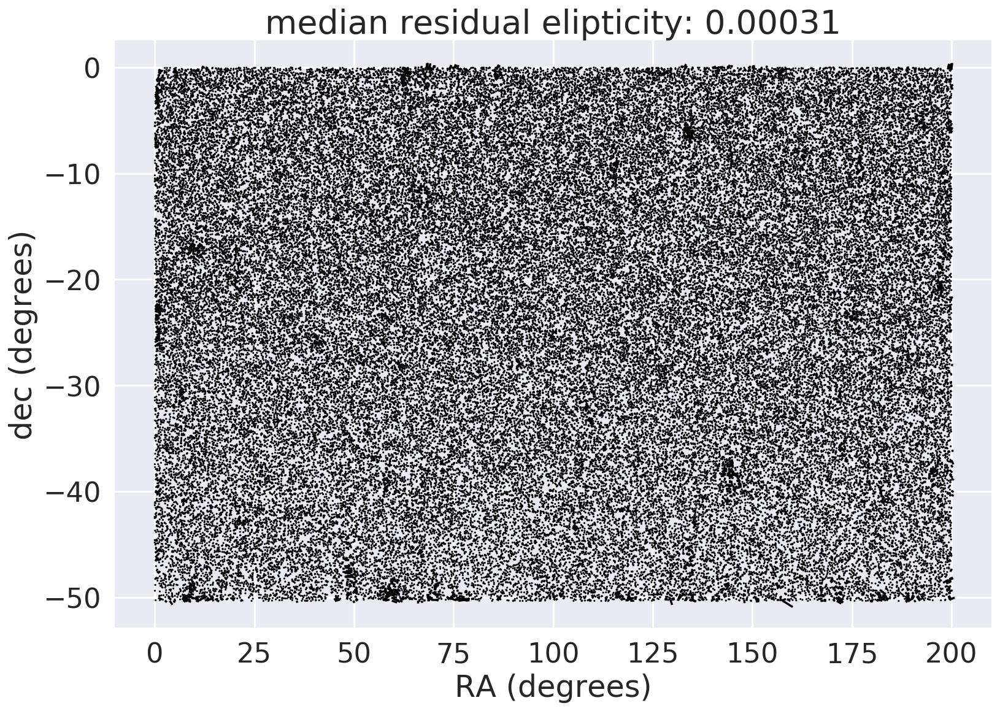

In [32]:
ditherplot(RotVisitHorizontalY10.DELTA, statistic='median',scale=0.2)

### Hexagonal Dithers at Y10
Using hexDithersPerVisit. 

In [82]:
%%time
HexVisitY10 = ModelErrors('radial', rotDithers=None, DitherPattern='hex_visit')
HexVisitY10.process(sqlWhere='filter = "r" and night < 3653 \
and fieldRA < {} and fieldDec > {} \
and fieldRA > 0 and fieldDec < 0'.format(np.radians(200), np.radians(-50)))

getting the dither positions from the database:  hexDitherFieldPerVisit
using stackers: [<lsst.sims.maf.stackers.ditherStackers.HexDitherFieldPerVisitStacker object at 0x2b42019448d0>]
old sims
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database Summary with constraint filter = "r" and night < 3653 and fieldRA < 3.490658503988659 and fieldDec > -0.8726646259971648 and fieldRA > 0 and fieldDec < 0 for columns ['night', 'fieldRA', 'fieldDec', 'fieldID']
Found 260016 visits
Running:  ['hexDitherFieldPerVisit dither']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
not using rotational dithering
Summary: we are using the OpsimRun at /global/homes/h/husni/lsstpsf/simruns/minion_1012, with the translational dither pattern: hexDitherFieldPerVisit. Rotation: None
creating the models at every dither, this will take a while
moving back from moment space to elipticities
finding rhos
CPU times: user 7min 12s, sys:

### Random dithers at Y10
Using randomDithersPerVisit

In [88]:
%%time
RandomVisitY10 = ModelErrors('radial',rotDithers=None, DitherPattern='random_visit')
RandomVisitY10.process(sqlWhere='filter = "r" and night < 3653 \
and fieldRA < {} and fieldDec > {} \
and fieldRA > 0 and fieldDec < 0'.format(np.radians(200), np.radians(-50)))

getting the dither positions from the database:  randomDitherFieldPerVisit
using stackers: [<lsst.sims.maf.stackers.ditherStackers.RandomDitherFieldPerVisitStacker object at 0x2b41fec8cb38>]
old sims
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database Summary with constraint filter = "r" and night < 3653 and fieldRA < 3.490658503988659 and fieldDec > -0.8726646259971648 and fieldRA > 0 and fieldDec < 0 for columns ['night', 'fieldRA', 'fieldDec']
Found 260016 visits
Running:  ['randomDitherFieldPerVisit dither']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
not using rotational dithering
Summary: we are using the OpsimRun at /global/homes/h/husni/lsstpsf/simruns/minion_1012, with the translational dither pattern: randomDitherFieldPerVisit. Rotation: None
creating the models at every dither, this will take a while
moving back from moment space to elipticities
finding rhos
CPU times: user 1min 30s, sys

### Spiral dithers at Y10
Using spiralDithersPerVisit

In [89]:
%%time
SpiralVisitY10 = ModelErrors('radial',rotDithers=None, DitherPattern='spiral_visit')
SpiralVisitY10.process(sqlWhere='filter = "r" and night < 3653 \
and fieldRA < {} and fieldDec > {} \
and fieldRA > 0 and fieldDec < 0'.format(np.radians(200), np.radians(-50)))

getting the dither positions from the database:  spiralDitherFieldPerVisit
using stackers: [<lsst.sims.maf.stackers.ditherStackers.SpiralDitherFieldPerVisitStacker object at 0x2b420126e438>]
old sims
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database Summary with constraint filter = "r" and night < 3653 and fieldRA < 3.490658503988659 and fieldDec > -0.8726646259971648 and fieldRA > 0 and fieldDec < 0 for columns ['night', 'fieldRA', 'fieldDec', 'fieldID']
Found 260016 visits
Running:  ['spiralDitherFieldPerVisit dither']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
not using rotational dithering
Summary: we are using the OpsimRun at /global/homes/h/husni/lsstpsf/simruns/minion_1012, with the translational dither pattern: spiralDitherFieldPerVisit. Rotation: None
creating the models at every dither, this will take a while
moving back from moment space to elipticities
finding rhos
CPU times: user 1m

#### KS Test for HexVisitY10:

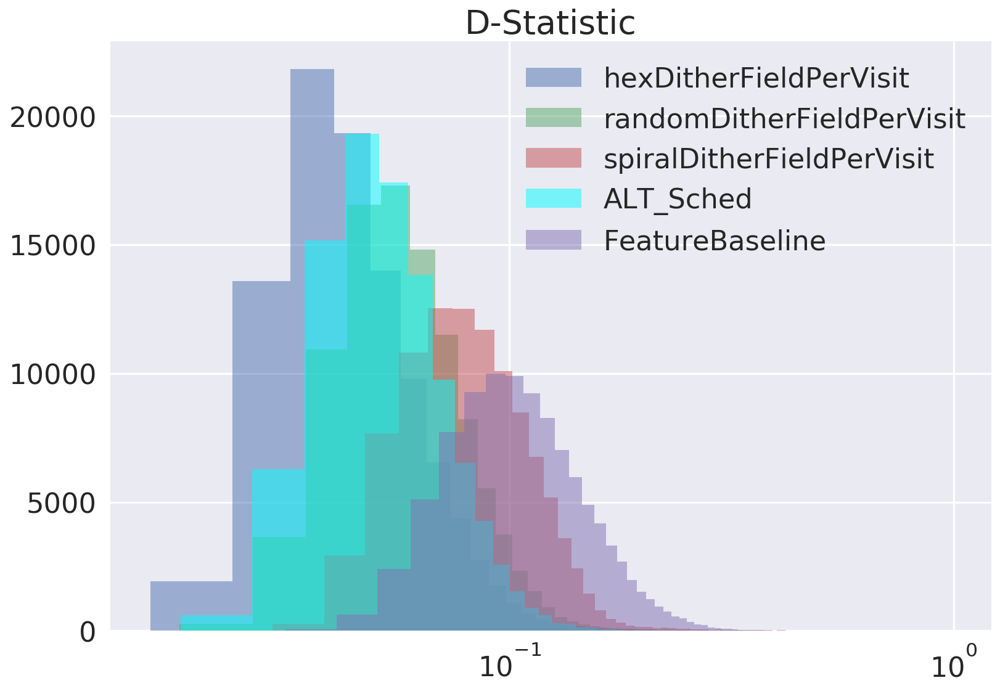

In [36]:
for run in [HexVisitY10, RandomVisitY10, SpiralVisitY10]:

    sts = []
    for angles in run.savedStarsAngles.values():
        sts.append(stats.kstest(angles,'uniform',args=(-90,180)).statistic)
    plt.hist(sts,bins=100,alpha=0.5,label=str(run.DitherPattern));
    
sts = []
for angles in ALT_SchedY10.savedStarsAngles.values():
    sts.append(stats.kstest(angles, 'uniform', args=(-90,180)).statistic)
plt.hist(sts,bins=100,alpha=0.5,label='ALT_Sched',color='cyan')

sts = []
for angles in FeatureBaselineY10.savedStarsAngles.values():
    sts.append(stats.kstest(angles, 'uniform', args=(-90,180)).statistic)
plt.hist(sts,bins=100,alpha=0.5,label='FeatureBaseline')

plt.title('D-Statistic');
plt.xscale('log')
plt.legend()

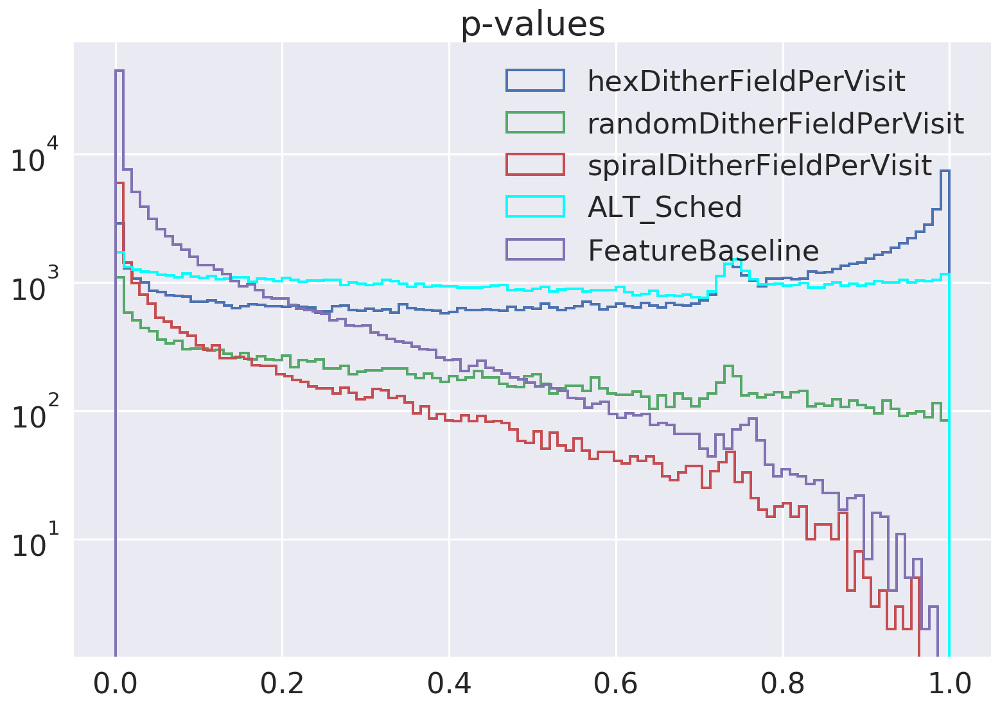

In [117]:
for run in [HexVisitY10, RandomVisitY10, SpiralVisitY10]:

    sts = []
    pvalues = []
    for angles in run.savedStarsAngles.values():
        pvalues.append(stats.kstest(angles,'uniform',args=(-90,180)).pvalue)
    plt.hist(pvalues,bins=100,label=str(run.DitherPattern), histtype='step', linewidth=2);
    plt.title('D-Statistic');
    
    
sts = []
for angles in ALT_SchedY10.savedStarsAngles.values():
    sts.append(stats.kstest(angles, 'uniform', args=(-90,180)).pvalue)
plt.hist(sts,bins=100,label='ALT_Sched',color='cyan', histtype='step' , linewidth=2)

sts = []
for angles in FeatureBaselineY10.savedStarsAngles.values():
    sts.append(stats.kstest(angles, 'uniform', args=(-90,180)).pvalue)
plt.hist(sts,bins=100,label='FeatureBaseline', histtype='step', linewidth=2)

plt.yscale('log')
plt.legend()
plt.title('p-values');

# Doing the same but at y1

In [76]:
%%time
RotVisitHorizontalY1 = ModelErrors('horizontal', DitherPattern='hex_visit',OpsimRun='minion_1012')
RotVisitHorizontalY1.process(sqlWhere='filter = "r" and night < 365 \
and fieldRA < {} and fieldDec > {} \
and fieldRA > 0 and fieldDec < 0'.format(np.radians(200), np.radians(-50)))

getting the dither positions from the database:  hexDitherFieldPerVisit
using stackers: [<lsst.sims.maf.stackers.ditherStackers.HexDitherFieldPerVisitStacker object at 0x2b41fdce0710>, <lsst.sims.maf.stackers.ditherStackers.RandomRotDitherPerFilterChangeStacker object at 0x2b41fdce0f60>]
old sims
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database Summary with constraint filter = "r" and night < 365 and fieldRA < 3.490658503988659 and fieldDec > -0.8726646259971648 and fieldRA > 0 and fieldDec < 0 for columns ['fieldDec', 'night', 'rotTelPos', 'filter', 'fieldID', 'fieldRA']
Found 27668 visits
Running:  ['hexDitherFieldPerVisit dither']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
getting random rotational dithers
Summary: we are using the OpsimRun at /global/homes/h/husni/lsstpsf/simruns/minion_1012, with the translational dither pattern: hexDitherFieldPerVisit. Rotation: random_filter
creating the

In [77]:
FeatureBaselineRollingY1 = ModelErrors('radial', DitherPattern='field', OpsimRun='feature_rolling_half_mask_10yrs')
FeatureBaselineRollingY1.process(sqlWhere='filter = "r" and night < 365 \
and fieldRA < {} and fieldDec > {} \
and fieldRA > 0 and fieldDec < 0 and proposalId = 0'.format(200,-50))

getting the dither positions from the database:  field
using stackers: [None, <lsst.sims.maf.stackers.ditherStackers.RandomRotDitherPerFilterChangeStacker object at 0x2b41a41bd4a8>]
new sim
Healpix slicer using NSIDE=128, approximate resolution 27.483891 arcminutes
Querying database SummaryAllProps with constraint filter = "r" and night < 365 and fieldRA < 200 and fieldDec > -50 and fieldRA > 0 and fieldDec < 0 and proposalId = 0 for columns ['observationStartMJD', 'fieldDec', 'rotTelPos', 'filter', 'fieldRA']
Found 14328 visits
Running:  ['field dither']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
getting random rotational dithers
Summary: we are using the OpsimRun at /global/homes/h/husni/lsstpsf/simruns/feature_rolling_half_mask_10yrs, with the translational dither pattern: field. Rotation: random_filter
creating the models at every dither, this will take a while
moving back from moment space to elipticities
finding rhos


In [145]:
FeatureBaselineRollingY09 = ModelErrors('radial', DitherPattern='field', OpsimRun='feature_rolling_half_mask_10yrs')
FeatureBaselineRollingY09.process(sqlWhere='filter = "r" and night < 330 \
and fieldRA < {} and fieldDec > {} \
and fieldRA > 0 and fieldDec < 0 and proposalId = 0'.format(200,-50))
FeatureBaselineRollingY08 = ModelErrors('radial', DitherPattern='field', OpsimRun='feature_rolling_half_mask_10yrs')
FeatureBaselineRollingY08.process(sqlWhere='filter = "r" and night < 300 \
and fieldRA < {} and fieldDec > {} \
and fieldRA > 0 and fieldDec < 0 and proposalId = 0'.format(200,-50))
FeatureBaselineRollingY07 = ModelErrors('radial', DitherPattern='field', OpsimRun='feature_rolling_half_mask_10yrs')
FeatureBaselineRollingY07.process(sqlWhere='filter = "r" and night < 270 \
and fieldRA < {} and fieldDec > {} \
and fieldRA > 0 and fieldDec < 0 and proposalId = 0'.format(200,-50))

getting the dither positions from the database:  field
using stackers: [None, <lsst.sims.maf.stackers.ditherStackers.RandomRotDitherPerFilterChangeStacker object at 0x2b832d230b00>]
new sim
Healpix slicer using NSIDE=128, approximate resolution 27.483891 arcminutes
Querying database SummaryAllProps with constraint filter = "r" and night < 330 and fieldRA < 200 and fieldDec > -50 and fieldRA > 0 and fieldDec < 0 and proposalId = 0 for columns ['fieldDec', 'filter', 'observationStartMJD', 'fieldRA', 'rotTelPos']
Found 12582 visits
Running:  ['field dither']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
getting random rotational dithers
Summary: we are using the OpsimRun at /global/homes/h/husni/lsstpsf/simruns/feature_rolling_half_mask_10yrs, with the translational dither pattern: field. Rotation: random_filter
creating the models at every dither, this will take a while
moving back from moment space to elipticities
finding rhos
getting the di

In [78]:
FeatureBaselineY1 = ModelErrors('radial', DitherPattern='field', OpsimRun='feature_baseline_10yrs')
FeatureBaselineY1.process(sqlWhere='filter = "r" and night < 365 \
and fieldRA < {} and fieldDec > {} \
and fieldRA > 0 and fieldDec < 0 and proposalId = 0'.format(200,-50))

getting the dither positions from the database:  field
using stackers: [None, <lsst.sims.maf.stackers.ditherStackers.RandomRotDitherPerFilterChangeStacker object at 0x2b41febd19b0>]
new sim
Healpix slicer using NSIDE=128, approximate resolution 27.483891 arcminutes
Querying database SummaryAllProps with constraint filter = "r" and night < 365 and fieldRA < 200 and fieldDec > -50 and fieldRA > 0 and fieldDec < 0 and proposalId = 0 for columns ['observationStartMJD', 'fieldDec', 'rotTelPos', 'filter', 'fieldRA']
Found 20932 visits
Running:  ['field dither']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
getting random rotational dithers
Summary: we are using the OpsimRun at /global/homes/h/husni/lsstpsf/simruns/feature_baseline_10yrs, with the translational dither pattern: field. Rotation: random_filter
creating the models at every dither, this will take a while
moving back from moment space to elipticities
finding rhos


In [42]:
ALT_SchedY1 = ModelErrors('radial', DitherPattern='field', OpsimRun='alt_sched')
ALT_SchedY1.process(sqlWhere='filter = "r" and night < 365 \
and fieldRA < {} and fieldDec > {} \
and fieldRA > 0 and fieldDec < 0'.format(200,-50))

getting the dither positions from the database:  field
using stackers: [None, <lsst.sims.maf.stackers.ditherStackers.RandomRotDitherPerFilterChangeStacker object at 0x2b82e523fb70>]
new sim
Healpix slicer using NSIDE=128, approximate resolution 27.483891 arcminutes
Querying database SummaryAllProps with constraint filter = "r" and night < 365 and fieldRA < 200 and fieldDec > -50 and fieldRA > 0 and fieldDec < 0 for columns ['fieldDec', 'filter', 'observationStartMJD', 'fieldRA', 'rotTelPos']
Found 25620 visits
Running:  ['field dither']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
getting random rotational dithers
Summary: we are using the OpsimRun at /global/homes/h/husni/lsstpsf/simruns/alt_sched, with the translational dither pattern: field. Rotation: random_filter
creating the models at every dither, this will take a while
moving back from moment space to elipticities
finding rhos


In [43]:
%%time
RandomVisitY1 = ModelErrors('radial', DitherPattern='random_visit')
RandomVisitY1.process(sqlWhere='filter = "r" and night < 365 \
and fieldRA < {} and fieldDec > {} \
and fieldRA > 0 and fieldDec < 0'.format(np.radians(200), np.radians(-50)))

getting the dither positions from the database:  randomDitherFieldPerVisit
using stackers: [<lsst.sims.maf.stackers.ditherStackers.RandomDitherFieldPerVisitStacker object at 0x2b82ef490080>, <lsst.sims.maf.stackers.ditherStackers.RandomRotDitherPerFilterChangeStacker object at 0x2b82eed382b0>]
old sims
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database Summary with constraint filter = "r" and night < 365 and fieldRA < 3.490658503988659 and fieldDec > -0.8726646259971648 and fieldRA > 0 and fieldDec < 0 for columns ['fieldDec', 'night', 'filter', 'fieldRA', 'rotTelPos']
Found 27668 visits
Running:  ['randomDitherFieldPerVisit dither']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
getting random rotational dithers
Summary: we are using the OpsimRun at /global/homes/h/husni/lsstpsf/simruns/minion_1012, with the translational dither pattern: randomDitherFieldPerVisit. Rotation: random_filter
creating th

In [71]:
%%time
SpiralVisitY1 = ModelErrors('radial', DitherPattern='spiral_visit')
SpiralVisitY1.process(sqlWhere='filter = "r" and night < 365 \
and fieldRA < {} and fieldDec > {} \
and fieldRA > 0 and fieldDec < 0'.format(np.radians(200), np.radians(-50)))

NameError: name 'ModelErrors' is not defined

In [45]:
%%time
HexVisitY1 = ModelErrors('radial', DitherPattern='hex_visit')
HexVisitY1.process(sqlWhere='filter = "r" and night < 365 \
and fieldRA < {} and fieldDec > {} \
and fieldRA > 0 and fieldDec < 0'.format(np.radians(200), np.radians(-50)))

getting the dither positions from the database:  hexDitherFieldPerVisit
using stackers: [<lsst.sims.maf.stackers.ditherStackers.HexDitherFieldPerVisitStacker object at 0x2b82ef808080>, <lsst.sims.maf.stackers.ditherStackers.RandomRotDitherPerFilterChangeStacker object at 0x2b82ef808b00>]
old sims
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database Summary with constraint filter = "r" and night < 365 and fieldRA < 3.490658503988659 and fieldDec > -0.8726646259971648 and fieldRA > 0 and fieldDec < 0 for columns ['fieldDec', 'night', 'filter', 'fieldRA', 'rotTelPos', 'fieldID']
Found 27668 visits
Running:  ['hexDitherFieldPerVisit dither']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
getting random rotational dithers
Summary: we are using the OpsimRun at /global/homes/h/husni/lsstpsf/simruns/minion_1012, with the translational dither pattern: hexDitherFieldPerVisit. Rotation: random_filter
creating the

In [46]:
%%time 
ALT_SchedRollingY1 = ModelErrors('radial', DitherPattern='field', OpsimRun='alt_sched_rolling')
ALT_SchedRollingY1.process(sqlWhere='filter = "r" and night < 365 \
and fieldRA < {} and fieldDec > {} \
and fieldRA > 0 and fieldDec < 0 and proposalId = 0'.format(200,-50))

getting the dither positions from the database:  field
using stackers: [None, <lsst.sims.maf.stackers.ditherStackers.RandomRotDitherPerFilterChangeStacker object at 0x2b82f017f8d0>]
new sim
Healpix slicer using NSIDE=128, approximate resolution 27.483891 arcminutes
Querying database SummaryAllProps with constraint filter = "r" and night < 365 and fieldRA < 200 and fieldDec > -50 and fieldRA > 0 and fieldDec < 0 and proposalId = 0 for columns ['fieldDec', 'filter', 'observationStartMJD', 'fieldRA', 'rotTelPos']
Found 26626 visits
Running:  ['field dither']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
getting random rotational dithers
Summary: we are using the OpsimRun at /global/homes/h/husni/lsstpsf/simruns/alt_sched_rolling, with the translational dither pattern: field. Rotation: random_filter
creating the models at every dither, this will take a while
moving back from moment space to elipticities
finding rhos
CPU times: user 1min 30s, sy

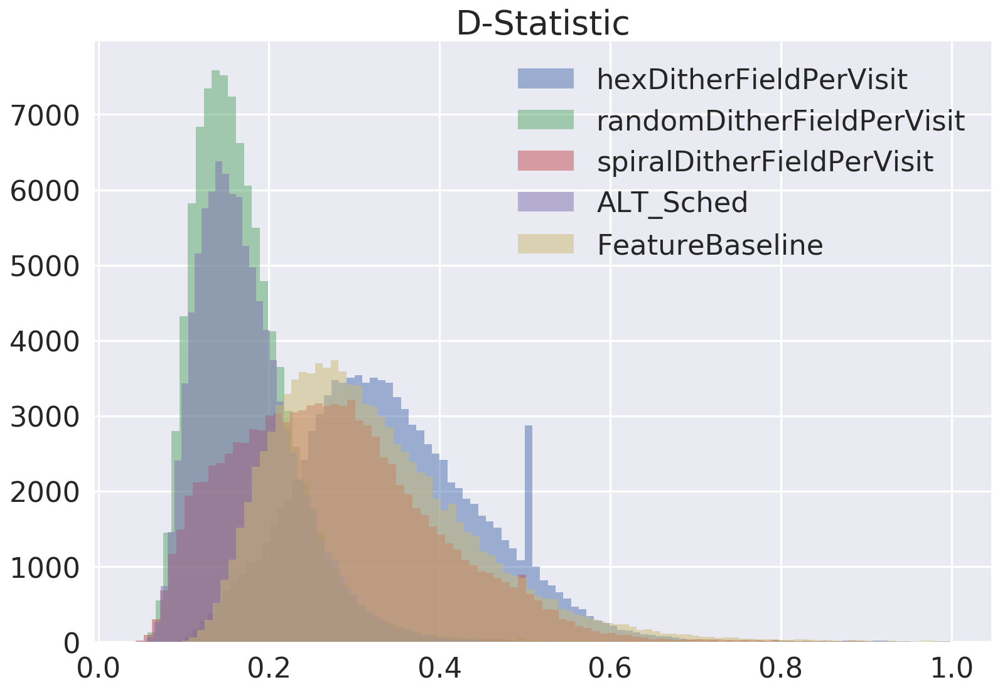

In [47]:
for run in [HexVisitY1, RandomVisitY1, SpiralVisitY1]:

    sts = []
    pvalues = []
    for angles in run.savedStarsAngles.values():
    #plt.hist(angles,alpha=0.2)
        sts.append(stats.kstest(angles,'uniform',args=(-90,180)).statistic)
    plt.hist(sts,bins=100,alpha=0.5,label=str(run.DitherPattern));
    
sts = []
for angles in ALT_SchedY1.savedStarsAngles.values():
    sts.append(stats.kstest(angles, 'uniform', args=(-90,180)).statistic)
plt.hist(sts,bins=100,alpha=0.5,label='ALT_Sched')

sts = []
for angles in FeatureBaselineY1.savedStarsAngles.values():
    sts.append(stats.kstest(angles, 'uniform', args=(-90,180)).statistic)
plt.hist(sts,bins=100,alpha=0.5,label='FeatureBaseline')


plt.title('D-Statistic');
plt.legend()

In [ ]:
for run in [HexVisitY1, RandomVisitY1, SpiralVisitY1]:

    sts = []
    pvalues = []
    for angles in run.savedStarsAngles.values():
    #plt.hist(angles,alpha=0.2)
        pvalues.append(stats.kstest(angles,'uniform',args=(-90,180),N=10).pvalue)

    plt.hist(pvalues,bins=100,alpha=0.5,label=str(run.DitherPattern));
    plt.title('D-Statistic');
    
sts = []
for angles in ALT_SchedY1.savedStarsAngles.values():
    sts.append(stats.kstest(angles, 'uniform', args=(-90,180)).pvalue)
plt.hist(sts,bins=100,alpha=0.5,label='ALT_Sched')

sts = []
for angles in FeatureBaselineY1.savedStarsAngles.values():
    sts.append(stats.kstest(angles, 'uniform', args=(-90,180)).pvalue)
plt.hist(sts,bins=100,alpha=0.5,label='FeatureBaseline')


plt.legend()
plt.yscale('log')
plt.title('p-values');

### Star whisker plot at y1 -- Random dithers

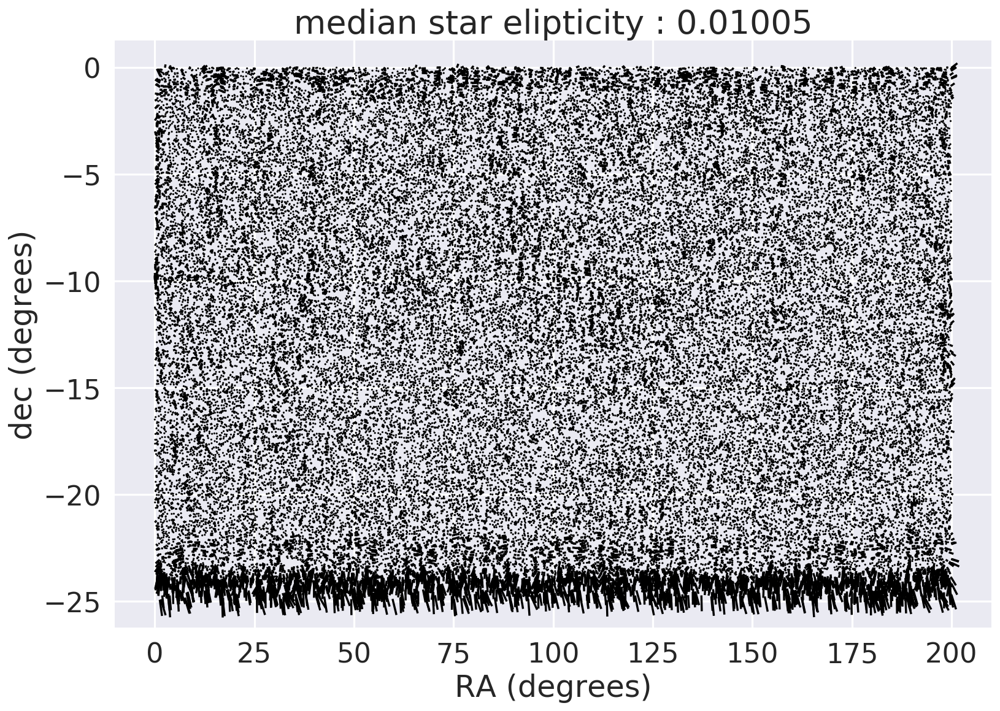

In [49]:
ditherplot(RandomVisitY1.STAR, statistic='median',scale=4)

### Residuals whisker plot at y1 -- Random dithers

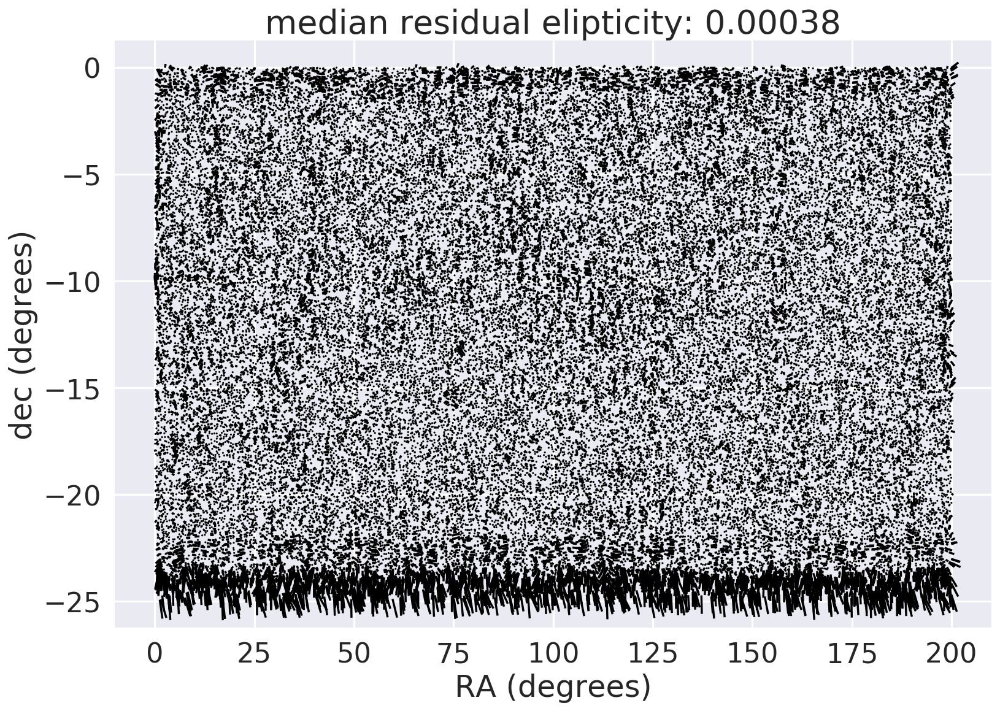

In [50]:
ditherplot(RandomVisitY1.DELTA, statistic='mean',scale=0.1)

## Finally, doing the same but for no dithering:

#### This is a little different to first exposures, since even without dithering on the scale of the , stars will still be seen by (very few) exposures.

In [97]:
%%time
RotVisitHorizontalNoDithers = ModelErrors('horizontal', DitherPattern='field',OpsimRun='minion_1012')
RotVisitHorizontalNoDithers.process(sqlWhere='filter = "r" and night < 365 \
and fieldRA < {} and fieldDec > {} \
and fieldRA > 0 and fieldDec < 0'.format(np.radians(200), np.radians(-50)))

getting the dither positions from the database:  field
using stackers: [None, <lsst.sims.maf.stackers.ditherStackers.RandomRotDitherPerFilterChangeStacker object at 0x2b422cc7c3c8>]
old sims
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database Summary with constraint filter = "r" and night < 365 and fieldRA < 3.490658503988659 and fieldDec > -0.8726646259971648 and fieldRA > 0 and fieldDec < 0 for columns ['fieldDec', 'night', 'rotTelPos', 'filter', 'fieldRA']
Found 27668 visits
Running:  ['field dither']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
getting random rotational dithers
Summary: we are using the OpsimRun at /global/homes/h/husni/lsstpsf/simruns/minion_1012, with the translational dither pattern: field. Rotation: random_filter
creating the models at every dither, this will take a while
moving back from moment space to elipticities
finding rhos
CPU times: user 1min 18s, sys: 1.05 s, total:

In [52]:
%%time
RotVisitHorizontalNoDithers = ModelErrors('horizontal', DitherPattern='field',OpsimRun='minion_1012')
RotVisitHorizontalNoDithers.process(sqlWhere='filter = "r" and night < 365 \
and fieldRA < {} and fieldDec > {} \
and fieldRA > 0 and fieldDec < 0'.format(np.radians(200), np.radians(-50)))

getting the dither positions from the database:  field
using stackers: [None, <lsst.sims.maf.stackers.ditherStackers.RandomRotDitherPerFilterChangeStacker object at 0x2b830d767cc0>]
old sims
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database Summary with constraint filter = "r" and night < 365 and fieldRA < 3.490658503988659 and fieldDec > -0.8726646259971648 and fieldRA > 0 and fieldDec < 0 for columns ['fieldDec', 'night', 'filter', 'fieldRA', 'rotTelPos']
Found 27668 visits
Running:  ['field dither']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
getting random rotational dithers
Summary: we are using the OpsimRun at /global/homes/h/husni/lsstpsf/simruns/minion_1012, with the translational dither pattern: field. Rotation: random_filter
creating the models at every dither, this will take a while
moving back from moment space to elipticities
finding rhos
CPU times: user 1min 26s, sys: 2.34 s, total:

In [53]:
%%time
NoDithers = ModelErrors(ModelType='radial',DitherPattern='field')
NoDithers.process(sqlWhere='filter = "r" and night < 3650 and fieldRA < %f and fieldDec > %f and fieldRA > 0 and fieldDec < 0' % (np.radians(200), np.radians(-50)))

getting the dither positions from the database:  field
using stackers: [None, <lsst.sims.maf.stackers.ditherStackers.RandomRotDitherPerFilterChangeStacker object at 0x2b830d16bb70>]
old sims
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database Summary with constraint filter = "r" and night < 3650 and fieldRA < 3.490659 and fieldDec > -0.872665 and fieldRA > 0 and fieldDec < 0 for columns ['fieldDec', 'night', 'filter', 'fieldRA', 'rotTelPos']
Found 260016 visits
Running:  ['field dither']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
getting random rotational dithers
Summary: we are using the OpsimRun at /global/homes/h/husni/lsstpsf/simruns/minion_1012, with the translational dither pattern: field. Rotation: random_filter
creating the models at every dither, this will take a while
moving back from moment space to elipticities
finding rhos
CPU times: user 8min 5s, sys: 6.69 s, total: 8min 11s
Wall tim

## Comparison between Y1 and Y10 across dither patterns:

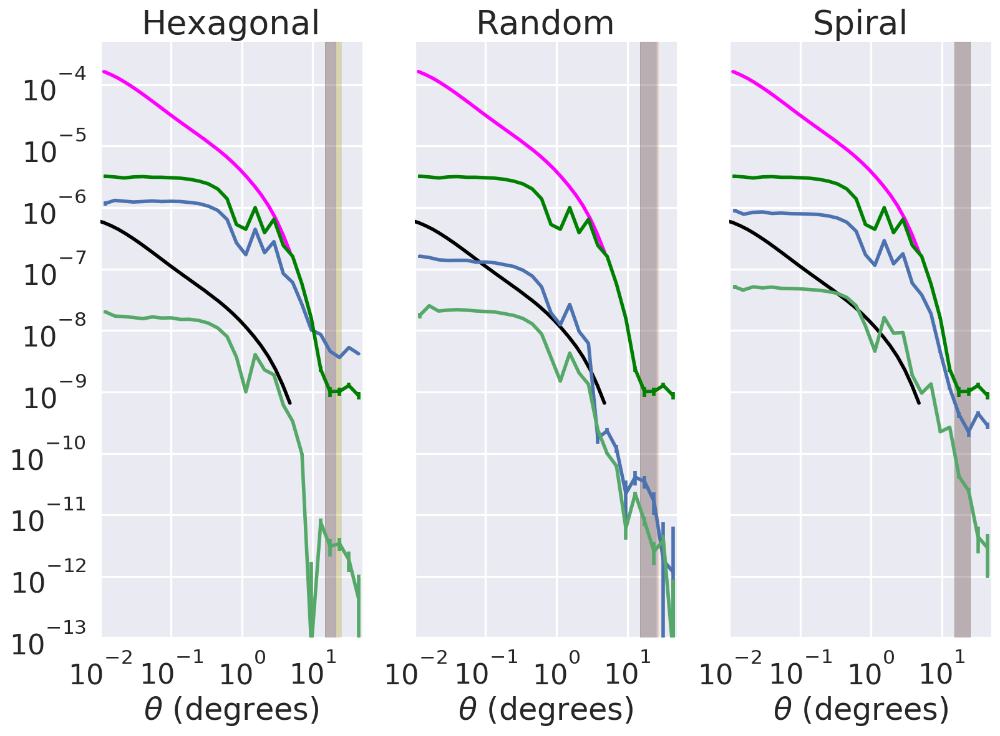

In [143]:
sns.set_style('darkgrid')
f, (ax1, ax2, ax3) = plt.subplots(1, 3, sharey=True)
ax1.errorbar(HexVisitY1.r, abs(HexVisitY1.delta_xip), yerr=HexVisitY1.delta_xip_sigma,label=r'$\delta \xi_+$ Y1')
ax1.errorbar(HexVisitY10.r, abs(HexVisitY10.delta_xip), yerr=HexVisitY10.delta_xip_sigma,label=r'$\delta \xi_+$ Y10')
ax1.errorbar(NoDithers.r, abs(NoDithers.delta_xip), yerr=NoDithers.delta_xip_sigma, label=r'$\delta \xi_+$ NoDithers',color='g')
negindx = [ind for ind,val in enumerate(NoDithers.delta_xip) if val<0]
ax1.axvspan(negindx[0], negindx[-1], alpha=0.1, color='g')
negindx = [ind for ind,val in enumerate(HexVisitY1.delta_xip) if val<0]
ax1.axvspan(negindx[0], negindx[-1], alpha=0.2, color='blue')
negindx = [ind for ind,val in enumerate(HexVisitY10.delta_xip) if val<0]
ax1.axvspan(negindx[0], negindx[-1], alpha=0.2, color='orange')
ax1.set_title('Hexagonal')
    

ax2.errorbar(RandomVisitY1.r, abs(RandomVisitY1.delta_xip), yerr=RandomVisitY1.delta_xip_sigma,label=r'$\delta \xi_+$ Y1')
ax2.errorbar(RandomVisitY10.r, abs(RandomVisitY10.delta_xip), yerr=RandomVisitY10.delta_xip_sigma,label=r'$\delta \xi_+$ Y10')
ax2.errorbar(NoDithers.r, abs(NoDithers.delta_xip), yerr=NoDithers.delta_xip_sigma, label=r'$\delta \xi_+$ NoDithers',color='g')
negindx = [ind for ind,val in enumerate(NoDithers.delta_xip) if val<0]
ax2.axvspan(negindx[0], negindx[-1], alpha=0.1, color='g')
negindx = [ind for ind,val in enumerate(RandomVisitY1.delta_xip) if val<0]
ax2.axvspan(negindx[0], negindx[-1], alpha=0.2, color='blue')
negindx = [ind for ind,val in enumerate(RandomVisitY10.delta_xip) if val<0]
ax2.axvspan(negindx[0], negindx[-1], alpha=0.2, color='orange')
ax2.set_title('Random')

ax3.errorbar(SpiralVisitY1.r, abs(SpiralVisitY1.delta_xip), yerr=SpiralVisitY1.delta_xip_sigma,label=r'$\delta \xi_+$ Y1')
ax3.errorbar(SpiralVisitY10.r, abs(SpiralVisitY10.delta_xip), yerr=SpiralVisitY10.delta_xip_sigma,label=r'$\delta \xi_+$ Y10')
ax3.errorbar(NoDithers.r, abs(NoDithers.delta_xip), yerr=NoDithers.delta_xip_sigma, label=r'$\delta \xi_+$ NoDithers',color='g')
negindx = [ind for ind,val in enumerate(NoDithers.delta_xip) if val<0]
ax3.axvspan(negindx[0], negindx[-1], alpha=0.1, color='g')
negindx = [ind for ind,val in enumerate(SpiralVisitY1.delta_xip) if val<0]
ax3.axvspan(negindx[0], negindx[-1], alpha=0.2, color='blue')
negindx = [ind for ind,val in enumerate(SpiralVisitY10.delta_xip) if val<0]
ax3.axvspan(negindx[0], negindx[-1], alpha=0.2, color='orange')
ax3.set_title('Spiral')


for ax in [ax1,ax2,ax3]:
    ax.plot(r2d(1)*HexVisitY10.reqs_r[1:],HexVisitY10.rho134_reqs[1:],'black',label='Reqs')
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.set_xlim((0.01, 50))
    ax.set_ylim((10**(-13)),5*10**(-4))
    ax.set_xlabel(r'$\theta$ (degrees)')
    ax.plot(HexVisitY10.reqs_r[3:]*r2d(1), HexVisitY10.HSCCosmicShear_xip[3:], color='magenta',label=r'$\xi_+$ cosmic $\gamma$')


# ax1.set_ylabel(r'$\delta \xi_+$')
#f.legend(bbox_to_anchor=(0.29,0.35))



## Star whisker plot with no dithering

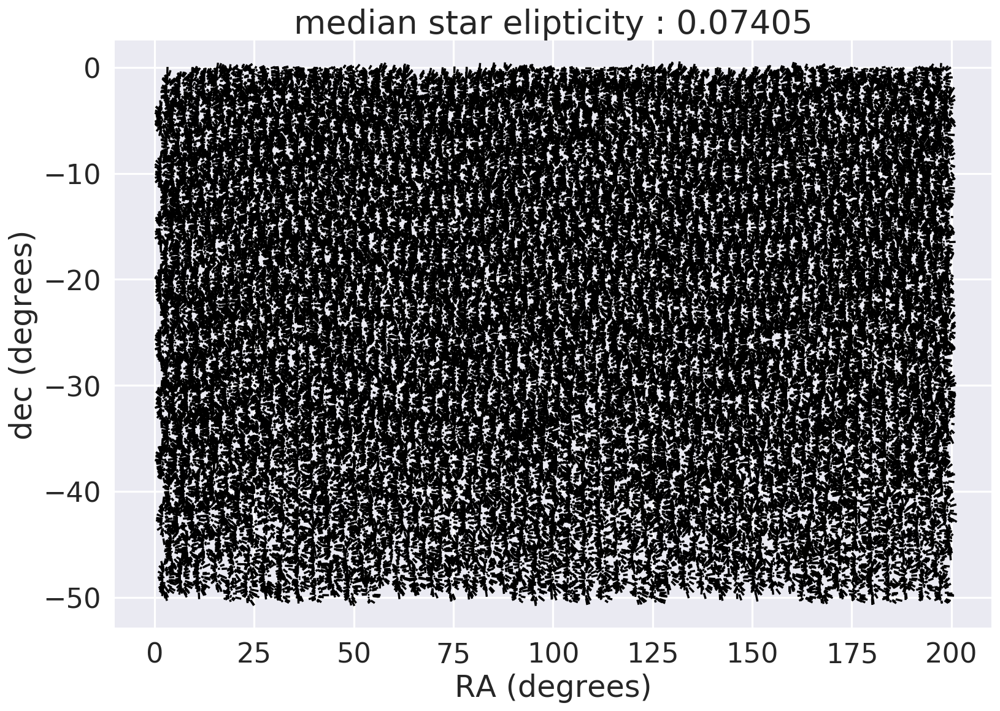

In [55]:
ditherplot(NoDithers.STAR, statistic='median',scale=10)

## Residuals whisker plot with no dithering

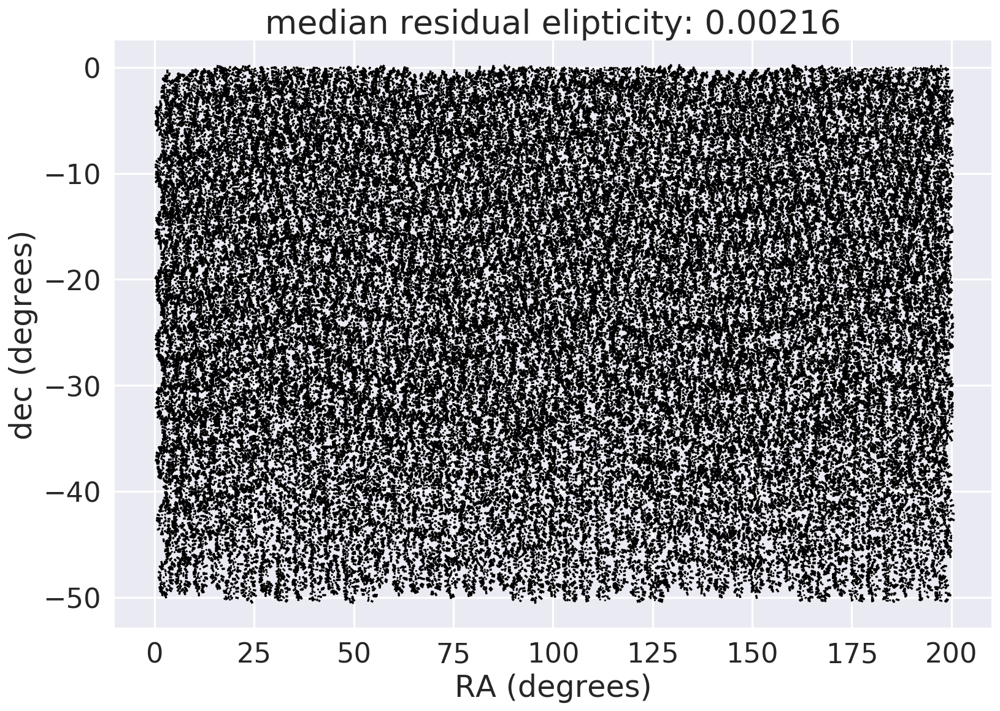

In [56]:
ditherplot(NoDithers.DELTA, statistic='median',scale=0.5)

/global/common/software/lsst/common/miniconda/py3-4.2.12/lib/python3.6/site-packages/matplotlib/axes/_axes.py:2818: MatplotlibDeprecationWarning: Use of None object as fmt keyword argument to suppress plotting of data values is deprecated since 1.4; use the string "none" instead.
  warnings.warn(msg, mplDeprecation, stacklevel=1)


(0.01, 50)

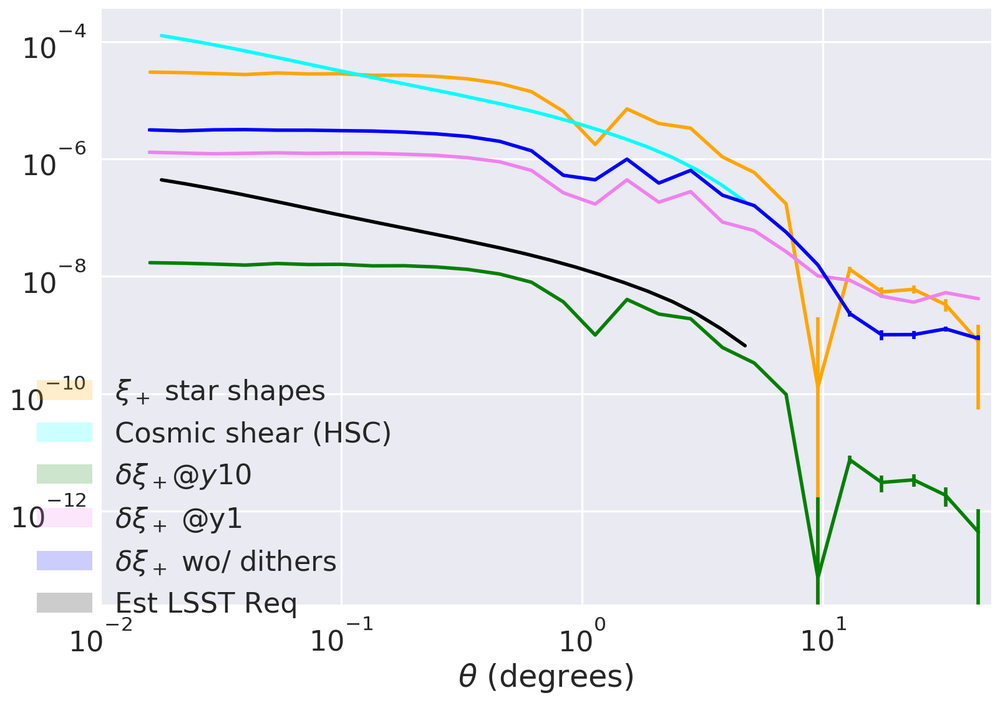

In [57]:
corrplot(HexVisitY10.r[1:], abs(HexVisitY10.xip[1:]), HexVisitY10.xip_sigma[1:],color='orange',scale='log')
corrplot(HexVisitY10.reqs_r[5:]*r2d(1), HexVisitY10.HSCCosmicShear_xip[5:], color='cyan')
corrplot(HexVisitY10.r[1:], abs(HexVisitY10.delta_xip[1:]), HexVisitY10.delta_xip_sigma[1:], color='green')
corrplot(HexVisitY1.r[1:], abs(HexVisitY1.delta_xip[1:]), HexVisitY1.delta_xip_sigma[1:], color='violet')
corrplot(NoDithers.r[1:], abs(NoDithers.delta_xip[1:]),NoDithers.delta_xip_sigma[1:], color='blue')
corrplot(r2d(1)*HexVisitY10.reqs_r[5:], HexVisitY10.rho134_reqs[5:], color='black', scale='log')
plt.legend([r'$\xi_+$ star shapes',r'Cosmic shear (HSC)',r'$\delta \xi_+ @y10$',r'$\delta \xi_+$ @y1',r'$\delta \xi_+$ wo/ dithers','Est LSST Req'],bbox_to_anchor=(0.34, 0.4), loc='upper right', borderaxespad=0.)
plt.xlim((0.01, 50))
#plt.yscale('symlog')
# plt.title('Figure 1. Comparison between PSF modelling errors, star shapes correlations, cosmic shear and estimated LSST requirements (from HSC)')

# --------------------------------------------------------------------
### Testing:

for some random star, does the star find the right number of dithers that can reach it? 

Say, for star 20 in RandomVisitY1:

Let's see this visually.

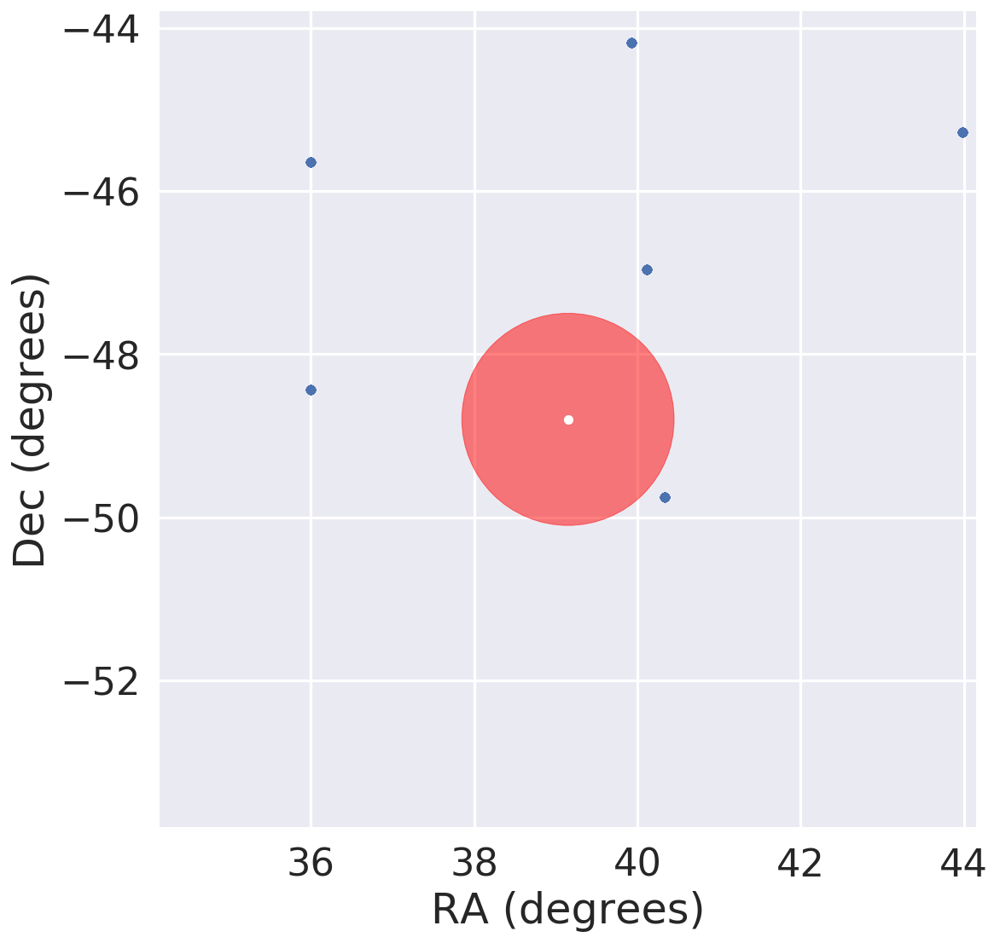

In [58]:
circle1 = plt.Circle((180/np.pi*NoDithers.stars[20,0], 180/np.pi*NoDithers.stars[20,1]),1.3,alpha=0.5,color='r')

fig, ax = plt.subplots()
ax.add_artist(circle1)

ax.plot(180/np.pi*NoDithers.positions[:,0], 180/np.pi*NoDithers.positions[:,1],'.')
ax.plot(180/np.pi*NoDithers.stars[20,0], 180/np.pi*NoDithers.stars[20,1], 'w.')

ax.set_xlim((180/np.pi*NoDithers.stars[20,0]-5,180/np.pi*NoDithers.stars[20,0]+5))
ax.set_ylim((180/np.pi*NoDithers.stars[20,1]-5,180/np.pi*NoDithers.stars[20,1]+5))
ax.set_aspect('equal')
ax.set_xlabel('RA (degrees)')
ax.set_ylabel('Dec (degrees)')

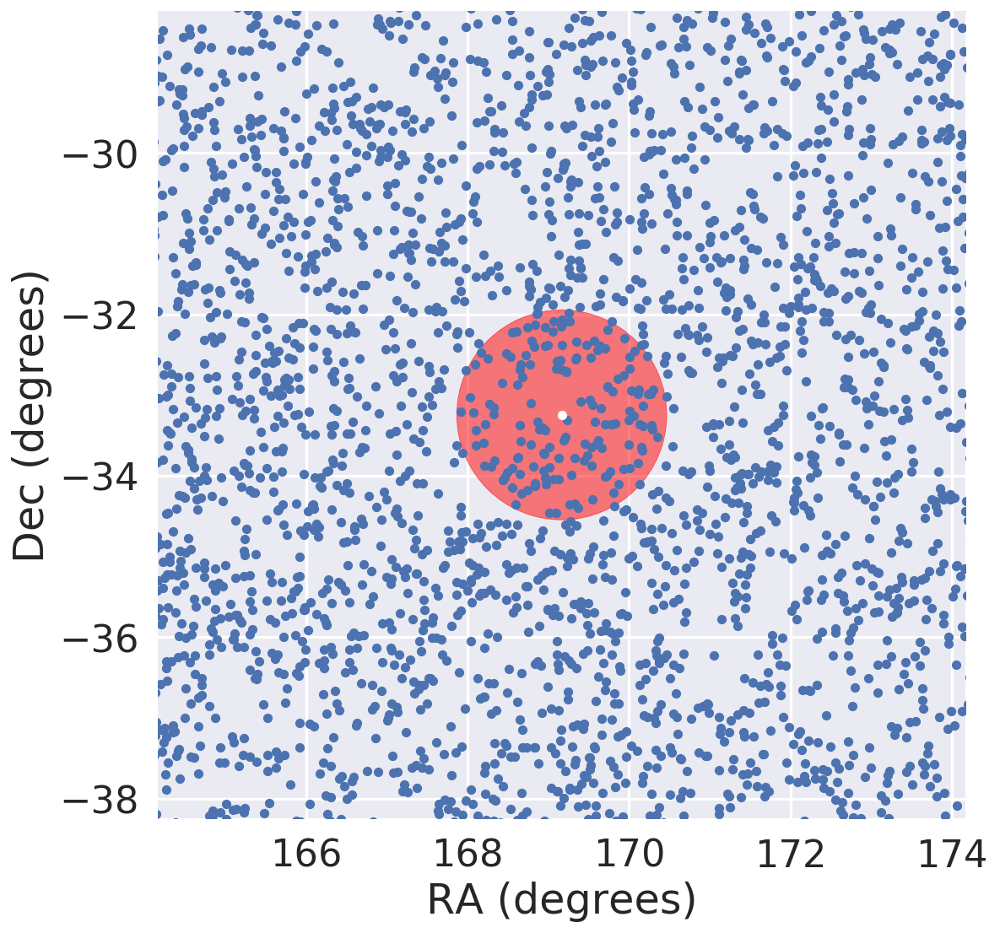

In [59]:
circle1 = plt.Circle((180/np.pi*RandomVisitY10.stars[20,0], 180/np.pi*RandomVisitY10.stars[20,1]),1.3,alpha=0.5,color='r')

fig, ax = plt.subplots()
ax.add_artist(circle1)

ax.plot(180/np.pi*RandomVisitY10.positions[:,0], 180/np.pi*RandomVisitY10.positions[:,1],'.')
ax.plot(180/np.pi*RandomVisitY10.stars[20,0], 180/np.pi*RandomVisitY10.stars[20,1], 'w.')

ax.set_xlim((180/np.pi*RandomVisitY10.stars[20,0]-5,180/np.pi*RandomVisitY10.stars[20,0]+5))
ax.set_ylim((180/np.pi*RandomVisitY10.stars[20,1]-5,180/np.pi*RandomVisitY10.stars[20,1]+5))

ax.set_aspect('equal')
ax.set_xlabel('RA (degrees)')
ax.set_ylabel('Dec (degrees)')

#### Quantify the distance between 2 $\delta \xi_+$ s

### Using a $\chi^2$ minimisation:

In [60]:
import scipy.optimize as opt
def fit(xi1,xi2,error, x0=1):

    def chisqfunc(m):
        model = m*xi2
        chisq = numpy.sum(((xi1 - model)/error)**2)
        return chisq

    result = opt.minimize(chisqfunc, x0)
    return result

In [61]:
import pandas as pd

In [62]:
df = pd.DataFrame(columns=['Y1','Y10'], index=['Hex','Random','Spiral', 'ALT_Sched', 'FeatureBaseline', 'ALT_SchedRolling', 'FeatureBaselineRolling'])
df['Y1']['Hex'] = df['Y10']['Hex'] = 1
df['Y1']['Spiral'] = fit(SpiralVisitY1.delta_xip, HexVisitY1.delta_xip, SpiralVisitY1.delta_xip_sigma).x[0]
df['Y1']['ALT_Sched'] = fit(ALT_SchedY1.delta_xip, HexVisitY1.delta_xip, ALT_SchedY1.delta_xip_sigma).x[0]
df['Y1']['Random'] = fit(RandomVisitY1.delta_xip, HexVisitY1.delta_xip, RandomVisitY1.delta_xip_sigma).x[0]
df['Y1']['FeatureBaseline'] = fit(FeatureBaselineY1.delta_xip, HexVisitY1.delta_xip, FeatureBaselineY1.delta_xip_sigma).x[0]
df['Y1']['ALT_SchedRolling'] = fit(ALT_SchedRollingY1.delta_xip[1:], HexVisitY1.delta_xip[1:], ALT_SchedRollingY1.delta_xip_sigma[1:]).x[0]
df['Y1']['FeatureBaselineRolling'] = fit(FeatureBaselineRollingY1.delta_xip, HexVisitY1.delta_xip, FeatureBaselineRollingY1.delta_xip_sigma).x[0]
df['Y10']['Spiral'] = fit(SpiralVisitY10.delta_xip, HexVisitY10.delta_xip, SpiralVisitY10.delta_xip_sigma).x[0]
df['Y10']['Random'] = fit(RandomVisitY10.delta_xip, HexVisitY10.delta_xip, RandomVisitY10.delta_xip_sigma).x[0]
df['Y10']['ALT_Sched'] = fit(ALT_SchedY10.delta_xip, HexVisitY10.delta_xip, ALT_SchedY10.delta_xip_sigma).x[0]
df['Y10']['FeatureBaseline'] = fit(abs(FeatureBaselineY10.delta_xip), abs(HexVisitY10.delta_xip), abs(FeatureBaselineY10.delta_xip_sigma)).x[0]
df['Y10']['FeatureBaselineRolling'] = ''
df['Y10']['ALT_SchedRolling'] = ''

In [63]:
df

,Y1,Y10
Hex,1,1
Random,0.0513461,1.02323
Spiral,0.635617,3.62188
ALT_Sched,0.0361362,0.62818
FeatureBaseline,0.284425,4.39657
ALT_SchedRolling,0.0515286,
FeatureBaselineRolling,0.0483415,


/global/common/software/lsst/common/miniconda/py3-4.2.12/lib/python3.6/site-packages/matplotlib/axes/_axes.py:2818: MatplotlibDeprecationWarning: Use of None object as fmt keyword argument to suppress plotting of data values is deprecated since 1.4; use the string "none" instead.
  warnings.warn(msg, mplDeprecation, stacklevel=1)


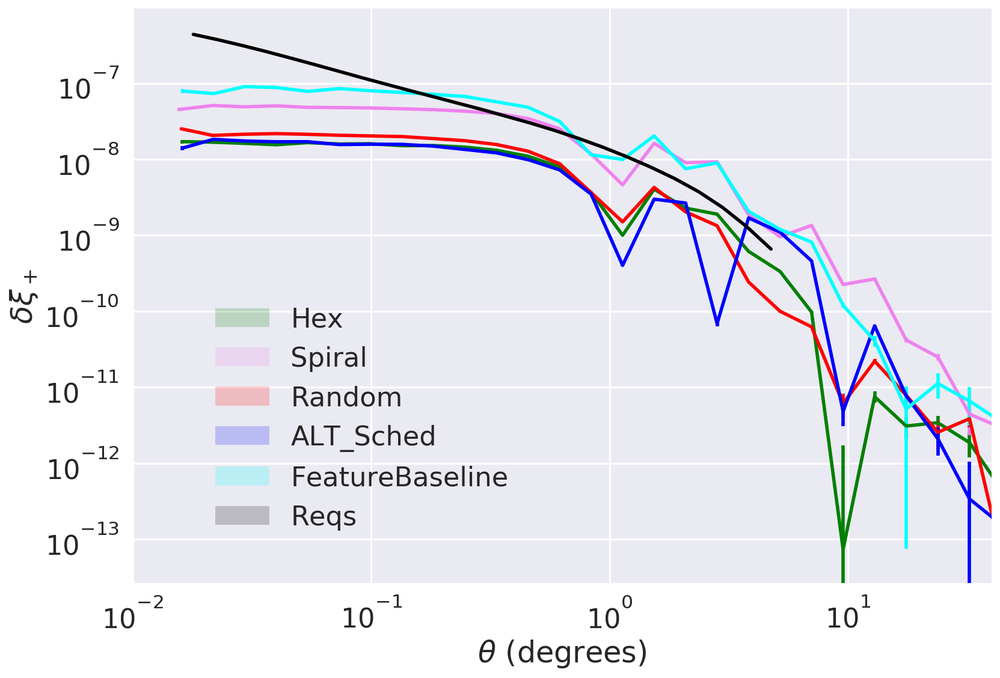

In [64]:
corrplot(HexVisitY10.r[1:], abs(HexVisitY10.delta_xip[1:]), HexVisitY10.delta_xip_sigma[1:], color='green')
corrplot(SpiralVisitY10.r[1:], abs(SpiralVisitY10.delta_xip[1:]), SpiralVisitY10.delta_xip_sigma[1:], color='violet')
corrplot(RandomVisitY10.r[1:], abs(RandomVisitY10.delta_xip[1:]), RandomVisitY10.delta_xip_sigma[1:], color='red')
corrplot(ALT_SchedY10.r[1:], abs(ALT_SchedY10.delta_xip[1:]),ALT_SchedY10.delta_xip_sigma[1:], color='blue')
corrplot(FeatureBaselineY10.r[1:], abs(FeatureBaselineY10.delta_xip[1:]),FeatureBaselineY10.delta_xip_sigma[1:], color='cyan')
corrplot(r2d(1)*HexVisitY10.reqs_r[5:], HexVisitY10.rho134_reqs[5:], color='black', scale='log')
plt.legend([r'Hex', 'Spiral', 'Random', 'ALT_Sched', 'FeatureBaseline', 'Reqs'],bbox_to_anchor=(0.45, 0.5), loc='upper right', borderaxespad=0.)
plt.xlim((0.01, 40))
plt.ylabel(r'$\delta \xi_+$')

/global/common/software/lsst/common/miniconda/py3-4.2.12/lib/python3.6/site-packages/matplotlib/axes/_axes.py:2818: MatplotlibDeprecationWarning: Use of None object as fmt keyword argument to suppress plotting of data values is deprecated since 1.4; use the string "none" instead.
  warnings.warn(msg, mplDeprecation, stacklevel=1)


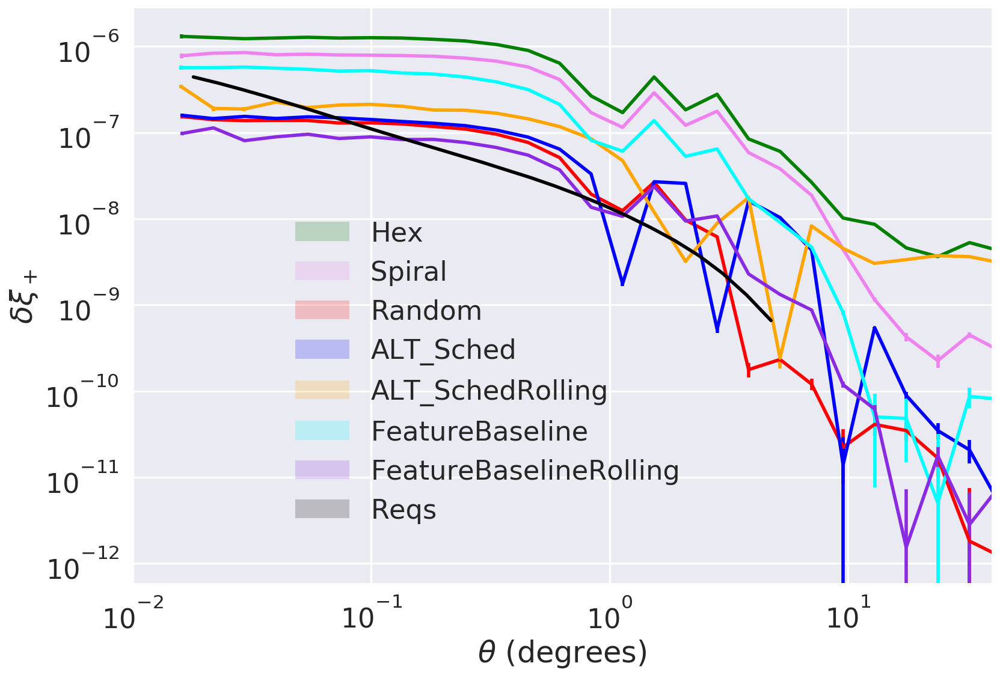

In [65]:
corrplot(HexVisitY1.r[1:], abs(HexVisitY1.delta_xip[1:]), HexVisitY1.delta_xip_sigma[1:], color='green')
corrplot(SpiralVisitY1.r[1:], abs(SpiralVisitY1.delta_xip[1:]), SpiralVisitY1.delta_xip_sigma[1:], color='violet')
corrplot(RandomVisitY1.r[1:], abs(RandomVisitY1.delta_xip[1:]), RandomVisitY1.delta_xip_sigma[1:], color='red')
corrplot(ALT_SchedY1.r[1:], abs(ALT_SchedY1.delta_xip[1:]),ALT_SchedY1.delta_xip_sigma[1:], color='blue')
corrplot(ALT_SchedRollingY1.r[1:], abs(ALT_SchedRollingY1.delta_xip[1:]),ALT_SchedRollingY1.delta_xip_sigma[1:], color='orange')
corrplot(FeatureBaselineY1.r[1:], abs(FeatureBaselineY1.delta_xip[1:]),FeatureBaselineY1.delta_xip_sigma[1:], color='cyan')
corrplot(FeatureBaselineRollingY1.r[1:], abs(FeatureBaselineRollingY1.delta_xip[1:]),FeatureBaselineRollingY1.delta_xip_sigma[1:], color='blueviolet')
corrplot(r2d(1)*HexVisitY1.reqs_r[5:], HexVisitY1.rho134_reqs[5:], color='black', scale='log')
plt.legend([r'Hex', 'Spiral', 'Random', 'ALT_Sched', 'ALT_SchedRolling','FeatureBaseline', 'FeatureBaselineRolling', 'Reqs'],bbox_to_anchor=(0.65, 0.65), loc='upper right', borderaxespad=0.)
plt.xlim((0.01, 40))
plt.ylabel(r'$\delta \xi_+$')

## Josh's metric

In [66]:
class uniformKSTest(metrics.BaseMetric):
    """
    Return the KS-test statistic. Values near zero are good, near 1 is bad.
    """
    def __init__(self, paCol = 'rotSkyPos', modVal=180., metricName='uniformKSTest', units='unitless', **kwargs):
        self.paCol = paCol
        self.modVal = modVal
        super(uniformKSTest, self).__init__(col=paCol, metricName=metricName, units=units, **kwargs)
    def run(self, dataSlice, slicePoint=None):
        angleDist = dataSlice[self.paCol] % self.modVal
        ks_D, pVal = stats.kstest(angleDist, 'uniform')
        return ks_D

In [67]:
class KuiperMetric(metrics.BaseMetric):
    """
    Like the KS test, but for periodic things.
    """
    def __init__(self, col='rotSkyPos', cdf=lambda x:x/(2*np.pi), args=(), period=2*np.pi, **kwargs):
        self.cdf = cdf
        self.args = args
        self.period = period
        assert self.cdf(0) == 0.0
        assert self.cdf(self.period) == 1.0
        super(KuiperMetric, self).__init__(col=col, **kwargs)
    def run(self, dataSlice, slicePoint=None):
        data = np.sort(dataSlice[self.colname] % self.period)
        cdfv = self.cdf(data, *self.args)
        N = len(data)
        D = np.amax(cdfv-np.arange(N)/float(N)) + np.amax((np.arange(N)+1)/float(N)-cdfv)
        return D

## Peter's Metric

In [1]:
import lsst.sims.maf.db as db
import lsst.sims.maf.metrics as metrics
import lsst.sims.maf.slicers as slicers
import lsst.sims.maf.batches as batches
import lsst.sims.maf.stackers as stackers
import lsst.sims.maf.metricBundles as metricBundles

In [3]:
from scipy.stats import uniform, kstest

In [3]:
def compass_bearing(lon1, lat1, lon2, lat2):
    """Calculate the bearing between two points
    
    Parameters
    ----------
    lon1 : float (or array)
        The longitude(s) for starting point(s) (radians)
    lat1 : float (or arrray)
        The latitudes(s) for the starting point(s) (radians)
    lon2 : float (or array)
        The longitude for the ending point(s) (radians)
    lat2 : float (or array)
        The latitude for the ending point(s) (radians)
        
    Returns
    -------
    bearing in radians (between 0 and 2pi)
        
    """
    long_diff = lon2 - lon1
    x = np.sin(long_diff)*np.cos(lat2)
    y = np.cos(lat1)*np.sin(lat2)-np.sin(lat1)*np.cos(lat2)*np.cos(long_diff)
    result = np.arctan2(x, y)
    result = (result+2*np.pi) % (2.*np.pi)
    return result


In [4]:
test_positions = {}
class AngleDist2PointingCenter(metrics.BaseMetric):
    """See how flat the distributing of angles pointing to the center of the FoV is
    
    Uses the KStest statistic--values of 0 are perfectly uniform, values of 1 are totally non-uniform.
    """
    def __init__(self, latCol='dec', lonCol='RA', degrees=True,
                 metricName='Pointing Center Distribution', **kwargs):
        # Make a uniform distribution beween 0 and 2pi
        col = [latCol, lonCol]
        self.latCol = latCol
        self.lonCol = lonCol
        super(AngleDist2PointingCenter, self).__init__(col=col, units='KS Statistic',
                                                       metricName=metricName, **kwargs)
        self.dist = uniform(loc=0, scale=2.*np.pi)
        self.degrees = degrees
    def run(self, dataSlice, slicePoint=None):
        if self.degrees:
            lat2 = np.radians(dataSlice[self.latCol])
            lon2 = np.radians(dataSlice[self.lonCol])
        else:
            lat2 = dataSlice[self.latCol]
            lon2 = dataSlice[self.lonCol]
        global test_positions
        test_positions['lon2, lat2'] = (lon2, lat2)
        test_positions['slicepoint'] = (slicePoint['ra'], slicePoint['dec'])
        # Bearing from this point in the sky to all the pointing centers
        bearings = compass_bearing(slicePoint['ra'], slicePoint['dec'], lon2, lat2)
        ks_result = kstest(bearings, self.dist.cdf)
        return ks_result.pvalue


### Random

In [72]:
outDir='temp'
conn = db.OpsimDatabaseV3('simruns/minion_1012_sqlite.db')
bundleList = []
sql = 'filter = "r" and night < 3653 \
and fieldRA < {} and fieldDec > {} \
and fieldRA > 0 and fieldDec < 0'.format(np.radians(200), np.radians(-50))
metric = AngleDist2PointingCenter(latCol='randomDitherFieldPerVisitDec', lonCol='randomDitherFieldPerVisitRa', degrees=False)
slicer = slicers.HealpixSlicer(nside=128, latCol='randomDitherFieldPerVisitDec', lonCol='randomDitherFieldPerVisitRa', latLonDeg=False)
dith_stack = stackers.RandomDitherFieldPerVisitStacker(raCol='fieldRA', decCol='fieldDec', degrees=False)
bundleList.append(metricBundles.MetricBundle(metric, slicer, sql, stackerList=[dith_stack]))
bd = metricBundles.makeBundlesDictFromList(bundleList)
mbg = metricBundles.MetricBundleGroup(bd, conn, outDir=outDir)
mbg.runAll()


results_bundle = bd['opsim_Pointing_Center_Distribution_r_and_night_lt_3653_and_fieldRA_lt_3_490658503988659_and_fieldDec_gt_-0_8726646259971648_and_fieldRA_gt_0_and_fieldDec_lt_0_HEAL']

random_hist = results_bundle.metricValues.data[np.where(results_bundle.metricValues.mask==False)]

Healpix slicer using NSIDE=128, approximate resolution 27.483891 arcminutes
Querying database Summary with constraint filter = "r" and night < 3653 and fieldRA < 3.490658503988659 and fieldDec > -0.8726646259971648 and fieldRA > 0 and fieldDec < 0 for columns ['fieldDec', 'fieldRA']
Found 260016 visits
Running:  ['opsim_Pointing_Center_Distribution_r_and_night_lt_3653_and_fieldRA_lt_3_490658503988659_and_fieldDec_gt_-0_8726646259971648_and_fieldRA_gt_0_and_fieldDec_lt_0_HEAL']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.


### Hexagonal

In [73]:
outDir='temp'
conn = db.OpsimDatabaseV3('simruns/minion_1012_sqlite.db')
bundleList = []
sql = 'filter = "r" and night < 3653 \
and fieldRA < {} and fieldDec > {} \
and fieldRA > 0 and fieldDec < 0'.format(np.radians(200), np.radians(-50))
metric = AngleDist2PointingCenter(latCol='hexDitherFieldPerVisitDec', lonCol='hexDitherFieldPerVisitRa', degrees=False)
slicer = slicers.HealpixSlicer(nside=128, latCol='hexDitherFieldPerVisitDec', lonCol='hexDitherFieldPerVisitRa', latLonDeg=False)
dith_stack = stackers.HexDitherFieldPerVisitStacker(raCol='fieldRA', decCol='fieldDec', degrees=False, fieldIdCol='fieldID')
bundleList.append(metricBundles.MetricBundle(metric, slicer, sql, stackerList=[dith_stack]))
bd = metricBundles.makeBundlesDictFromList(bundleList)
mbg = metricBundles.MetricBundleGroup(bd, conn, outDir=outDir)
mbg.runAll()
conn.close()


results_bundle = bd['opsim_Pointing_Center_Distribution_r_and_night_lt_3653_and_fieldRA_lt_3_490658503988659_and_fieldDec_gt_-0_8726646259971648_and_fieldRA_gt_0_and_fieldDec_lt_0_HEAL']

hex_hist = results_bundle.metricValues.data[np.where(results_bundle.metricValues.mask==False)]

Healpix slicer using NSIDE=128, approximate resolution 27.483891 arcminutes
Querying database Summary with constraint filter = "r" and night < 3653 and fieldRA < 3.490658503988659 and fieldDec > -0.8726646259971648 and fieldRA > 0 and fieldDec < 0 for columns ['fieldDec', 'fieldID', 'fieldRA']
Found 260016 visits
Running:  ['opsim_Pointing_Center_Distribution_r_and_night_lt_3653_and_fieldRA_lt_3_490658503988659_and_fieldDec_gt_-0_8726646259971648_and_fieldRA_gt_0_and_fieldDec_lt_0_HEAL']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.


### Spiral

In [74]:
outDir='temp'
conn = db.OpsimDatabaseV3('simruns/minion_1012_sqlite.db')
bundleList = []
sql = 'filter = "r" and night < 3653 \
and fieldRA < {} and fieldDec > {} \
and fieldRA > 0 and fieldDec < 0'.format(np.radians(200), np.radians(-50))
metric = AngleDist2PointingCenter(latCol='spiralDitherFieldPerVisitDec', lonCol='spiralDitherFieldPerVisitRa', degrees=False)
slicer = slicers.HealpixSlicer(nside=128, latCol='spiralDitherFieldPerVisitDec', lonCol='spiralDitherFieldPerVisitRa', latLonDeg=False)
dith_stack = stackers.SpiralDitherFieldPerVisitStacker(raCol='fieldRA', decCol='fieldDec', degrees=False, fieldIdCol='fieldID')
bundleList.append(metricBundles.MetricBundle(metric, slicer, sql, stackerList=[dith_stack]))
bd = metricBundles.makeBundlesDictFromList(bundleList)
mbg = metricBundles.MetricBundleGroup(bd, conn, outDir=outDir)
mbg.runAll()
conn.close()


results_bundle = bd['opsim_Pointing_Center_Distribution_r_and_night_lt_3653_and_fieldRA_lt_3_490658503988659_and_fieldDec_gt_-0_8726646259971648_and_fieldRA_gt_0_and_fieldDec_lt_0_HEAL']

spiral_hist = results_bundle.metricValues.data[np.where(results_bundle.metricValues.mask==False)]

Healpix slicer using NSIDE=128, approximate resolution 27.483891 arcminutes
Querying database Summary with constraint filter = "r" and night < 3653 and fieldRA < 3.490658503988659 and fieldDec > -0.8726646259971648 and fieldRA > 0 and fieldDec < 0 for columns ['fieldDec', 'fieldID', 'fieldRA']
Found 260016 visits
Running:  ['opsim_Pointing_Center_Distribution_r_and_night_lt_3653_and_fieldRA_lt_3_490658503988659_and_fieldDec_gt_-0_8726646259971648_and_fieldRA_gt_0_and_fieldDec_lt_0_HEAL']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.


## Feature Baseline

In [75]:
outDir='temp'
conn = db.OpsimDatabaseV4('simruns/feature_baseline_10yrs.db')
resultsDb = db.ResultsDb(outDir=outDir)

bundleList = []
sql = 'filter = "r" and night < 3653 \
and fieldRA < {} and fieldDec > {} \
and fieldRA > 0 and fieldDec < 0 and proposalId = 0'.format(200,-50)
metric = AngleDist2PointingCenter(latCol='fieldDec', lonCol='fieldRA')
slicer = slicers.HealpixSlicer(nside=128, latCol='fieldDec', lonCol='fieldRA')
bundleList.append(metricBundles.MetricBundle(metric, slicer, sql))
bd = metricBundles.makeBundlesDictFromList(bundleList)
mbg = metricBundles.MetricBundleGroup(bd, conn, outDir=outDir)
mbg.runAll()
conn.close()

results_bundle = bd['opsim_Pointing_Center_Distribution_r_and_night_lt_3653_and_fieldRA_lt_200_and_fieldDec_gt_-50_and_fieldRA_gt_0_and_fieldDec_lt_0_and_proposalId_0_HEAL']

feature_hist = results_bundle.metricValues.data[np.where(results_bundle.metricValues.mask==False)]

Healpix slicer using NSIDE=128, approximate resolution 27.483891 arcminutes
Querying database SummaryAllProps with constraint filter = "r" and night < 3653 and fieldRA < 200 and fieldDec > -50 and fieldRA > 0 and fieldDec < 0 and proposalId = 0 for columns ['fieldDec', 'fieldRA']
Found 224150 visits
Running:  ['opsim_Pointing_Center_Distribution_r_and_night_lt_3653_and_fieldRA_lt_200_and_fieldDec_gt_-50_and_fieldRA_gt_0_and_fieldDec_lt_0_and_proposalId_0_HEAL']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.


### ALT_Sched

In [8]:
outDir='temp'
conn = db.OpsimDatabaseV4('simruns/alt_sched.db')
resultsDb = db.ResultsDb(outDir=outDir)

bundleList = []
sql = 'filter = "r" and night < 3653 \
and fieldRA < {} and fieldDec > {} \
and fieldRA > 0 and fieldDec < 0 and proposalId = 0'.format(200,-50)
metric = AngleDist2PointingCenter(latCol='fieldDec', lonCol='fieldRA')
slicer = slicers.HealpixSlicer(nside=128, latCol='fieldDec', lonCol='fieldRA')
bundleList.append(metricBundles.MetricBundle(metric, slicer, sql))
bd = metricBundles.makeBundlesDictFromList(bundleList)
mbg = metricBundles.MetricBundleGroup(bd, conn, outDir=outDir)
mbg.runAll()
conn.close()

results_bundle = bd['opsim_Pointing_Center_Distribution_r_and_night_lt_3653_and_fieldRA_lt_200_and_fieldDec_gt_-50_and_fieldRA_gt_0_and_fieldDec_lt_0_and_proposalId_0_HEAL']

alt_hist = results_bundle.metricValues.data[np.where(results_bundle.metricValues.mask==False)]

Healpix slicer using NSIDE=128, approximate resolution 27.483891 arcminutes
Querying database SummaryAllProps with constraint filter = "r" and night < 3653 and fieldRA < 200 and fieldDec > -50 and fieldRA > 0 and fieldDec < 0 and proposalId = 0 for columns ['fieldRA', 'fieldDec']
Found 245053 visits
Running:  ['opsim_Pointing_Center_Distribution_r_and_night_lt_3653_and_fieldRA_lt_200_and_fieldDec_gt_-50_and_fieldRA_gt_0_and_fieldDec_lt_0_and_proposalId_0_HEAL']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.


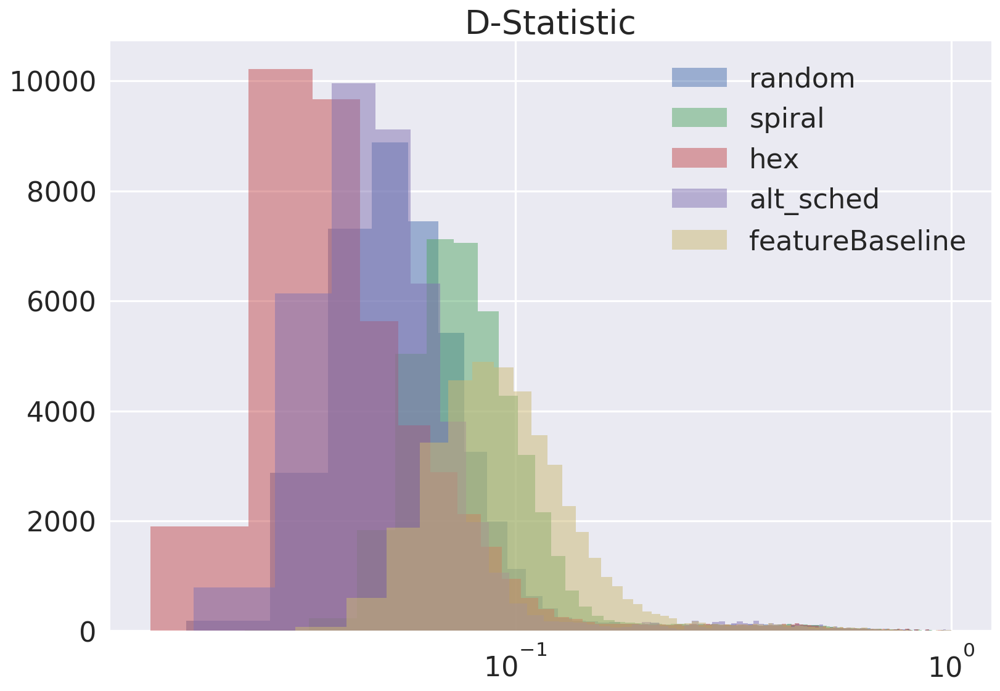

In [78]:
plt.hist(random_hist, label='random', bins=100, alpha=0.5)
plt.hist(spiral_hist, label='spiral', bins=100, alpha=0.5)
plt.hist(hex_hist, label='hex', bins=100, alpha=0.5)
plt.hist(alt_hist, label='alt_sched', bins=100, alpha=0.5)
plt.hist(feature_hist, label='featureBaseline', bins=100, alpha=0.5)


plt.xscale('log')
plt.title('D-Statistic')
plt.legend()

In [79]:
outDir='temp'
conn = db.OpsimDatabaseV3('simruns/minion_1012_sqlite.db')
bundleList = []
sql = 'filter = "r" and night < 3653 \
and fieldRA < {} and fieldDec > {} \
and fieldRA > 0 and fieldDec < 0'.format(np.radians(200), np.radians(-50))
metric = metrics.PassMetric()
slicer = slicers.OneDSlicer(sliceColName='night', binsize=1)
dith_stack = stackers.RandomRotDitherPerFilterChangeStacker( degrees=False)
bundleList.append(metricBundles.MetricBundle(metric, slicer, sql, stackerList=[dith_stack]))
bd = metricBundles.makeBundlesDictFromList(bundleList)
mbg = metricBundles.MetricBundleGroup(bd, conn, outDir=outDir, saveEarly= False)
mbg.runAll()
mbg.plotAll(closefigs=False)
conn.close()



Querying database Summary with constraint filter = "r" and night < 3653 and fieldRA < 3.490658503988659 and fieldDec > -0.8726646259971648 and fieldRA > 0 and fieldDec < 0 for columns ['night', 'filter', 'rotTelPos']
Found 260016 visits
Running:  ['opsim_Pass_r_and_night_lt_3653_and_fieldRA_lt_3_490658503988659_and_fieldDec_gt_-0_8726646259971648_and_fieldRA_gt_0_and_fieldDec_lt_0_ONED']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Plotting figures with "filter = "r" and night < 3653 and fieldRA < 3.490658503988659 and fieldDec > -0.8726646259971648 and fieldRA > 0 and fieldDec < 0" constraint now.
Plotting complete.


/global/u2/h/husni/newcontrib/sims_maf/python/lsst/sims/maf/plots/plotHandler.py:516: UserWarning: Cannot plot object metric values with this plotter.
  warnings.warn('Cannot plot object metric values with this plotter.')


/global/common/software/lsst/common/miniconda/py3-4.2.12/lib/python3.6/site-packages/matplotlib/axes/_axes.py:2818: MatplotlibDeprecationWarning: Use of None object as fmt keyword argument to suppress plotting of data values is deprecated since 1.4; use the string "none" instead.
  warnings.warn(msg, mplDeprecation, stacklevel=1)


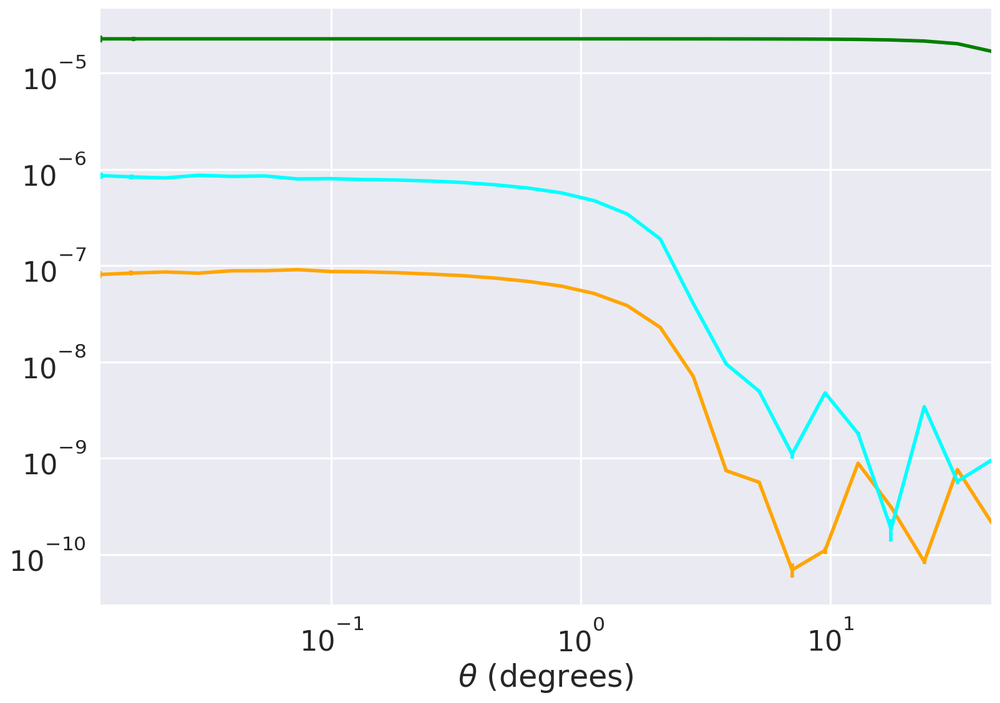

In [81]:
corrplot(RotVisitHorizontalY10.r, abs(RotVisitHorizontalY10.delta_xip), RotVisitHorizontalY10.delta_xip_sigma,color='orange',scale='log')
corrplot(RotVisitHorizontalY1.r, abs(RotVisitHorizontalY1.delta_xip), RotVisitHorizontalY1.delta_xip_sigma, color='cyan')
corrplot(RotVisitHorizontalNoDithers.r, abs(RotVisitHorizontalNoDithers.delta_xip), RotVisitHorizontalNoDithers.delta_xip_sigma, color='green')
plt.legend([r'$\delta \xi$ Y10', r'$\delta \xi$ Y1', r'$\delta \xi$ NoDithers'],bbox_to_anchor=(0.45, 0.5), loc='upper right', borderaxespad=0.)
#plt.ylabel(r'$')

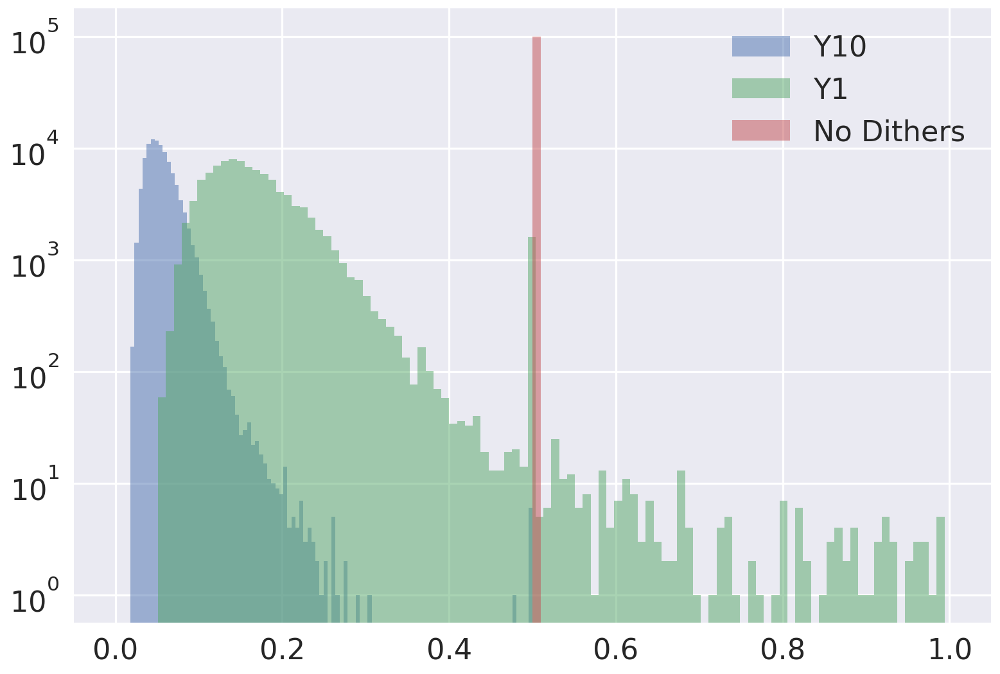

In [82]:
sts = []
for angles in RotVisitHorizontalY10.savedStarsAngles.values():
    sts.append(stats.kstest(angles, 'uniform', args=(-90,180)).statistic)
plt.hist(sts,bins=100,alpha=0.5, label='Y10');

sts = []
for angles in RotVisitHorizontalY1.savedStarsAngles.values():
    sts.append(stats.kstest(angles, 'uniform', args=(-90,180)).statistic)
plt.hist(sts,bins=100,alpha=0.5, label='Y1');

sts = []
for angles in RotVisitHorizontalNoDithers.savedStarsAngles.values():
    sts.append(stats.kstest(angles, 'uniform', args=(-90,180)).statistic)
plt.hist(sts,bins=100,alpha=0.5, label='No Dithers');

plt.legend()
plt.yscale('log')

In [ ]:
plt.hist(sts1,bins=100,alpha=0.5, label='Y10');
#plt.hist(sts2,bins=100,alpha=0.5, label='Y1');
plt.hist(sts3,alpha=1, label='No Dithers');
plt.legend()
plt.yscale('log')



/global/common/software/lsst/common/miniconda/py3-4.2.12/lib/python3.6/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


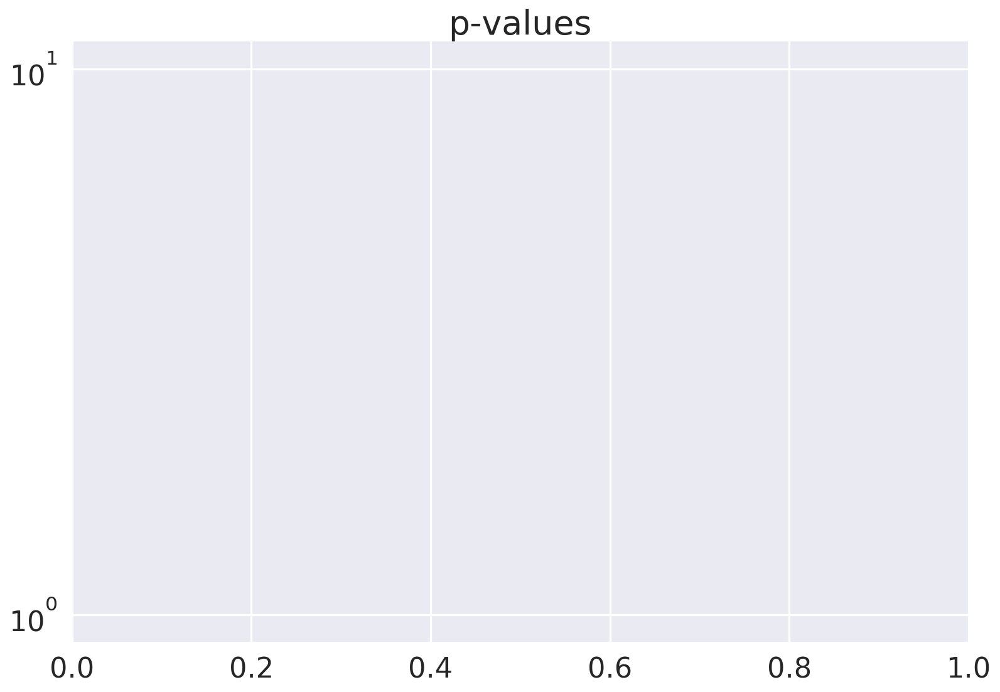

In [101]:
sts1 = []
for angles in RotVisitHorizontalY10.savedStarsAngles.values():
    sts1.append(stats.kstest(angles, 'uniform', args=(-90,180)).pvalue)
#plt.hist(sts,bins=100,alpha=0.5, label='Y10');

sts2 = []
for angles in RotVisitHorizontalY1.savedStarsAngles.values():
    sts2.append(stats.kstest(angles, 'uniform', args=(-90,180)).pvalue)
#plt.hist(sts,bins=100,alpha=0.5, label='Y1');

sts3 = []
for angles in RotVisitHorizontalNoDithers.savedStarsAngles.values():
    if stats.kstest(angles, 'uniform', args=(-90, 180)).pvalue > 0.5:
        pass
    else:
        sts3.append(stats.kstest(angles, 'uniform', args=(-90,180)).pvalue)
#plt.hist(sts,bins=100,alpha=0.5, label='No Dithers');

plt.legend()

plt.yscale('log')
plt.title('p-values')

In [97]:
print('there are ', len([i for i in sts if i>0.5]),' stars that only get observed once which explains the high p-values')

there are  6037  stars that only get observed once which explains the high p-values


NameError: name 'FeatureBaselineRollingY09' is not defined

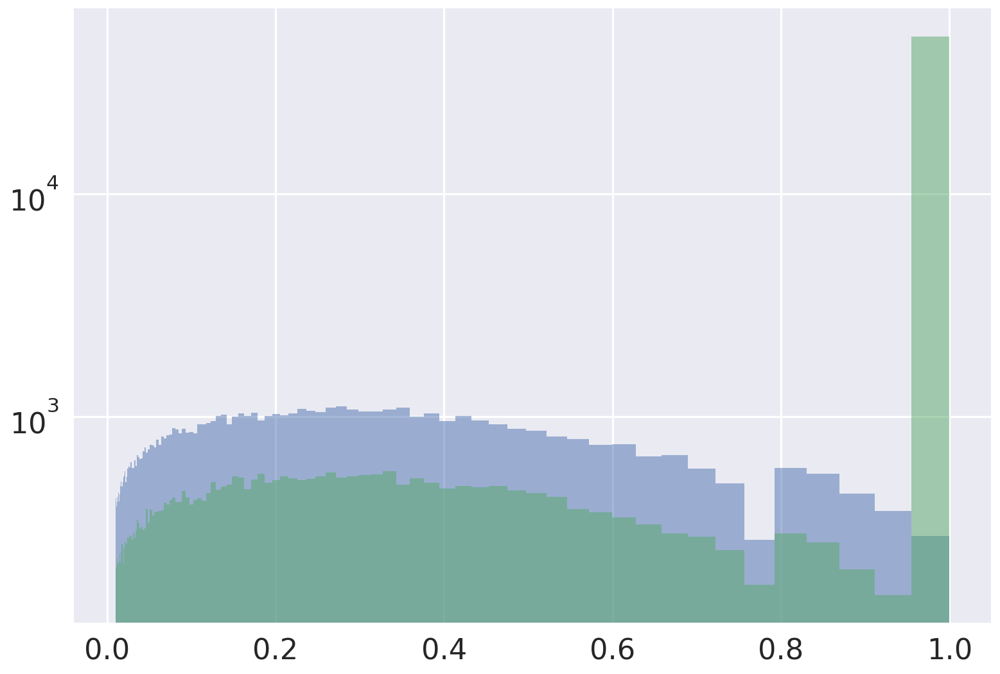

In [119]:
sts = []
for angles in FeatureBaselineY1.savedStarsAngles.values():
    sts.append(stats.kstest(angles, 'uniform', args=(-90,180)).pvalue)
plt.hist(sts,bins=np.logspace(-2,0,100),alpha=0.5, label='Y1');
plt.yscale('log')
sts = []
for angles in FeatureBaselineRollingY1.savedStarsAngles.values():
    sts.append(stats.kstest(angles, 'uniform', args=(-90,180)).pvalue)
plt.hist(sts,bins=np.logspace(-2,0,100),alpha=0.5, label='Y1 Rolling');

sts = []
for angles in FeatureBaselineRollingY09.savedStarsAngles.values():
    sts.append(stats.kstest(angles, 'uniform', args=(-90,180)).pvalue)
plt.hist(sts,bins=np.logspace(-2,0,100),alpha=0.4, label='M11 Rolling');

sts = []
for angles in FeatureBaselineRollingY08.savedStarsAngles.values():
    sts.append(stats.kstest(angles, 'uniform', args=(-90,180)).pvalue)
plt.hist(sts,bins=np.logspace(-2,0,100),alpha=0.3, label='M10 Rolling');

sts = []
for angles in FeatureBaselineRollingY07.savedStarsAngles.values():
    sts.append(stats.kstest(angles, 'uniform', args=(-90,180)).pvalue)
plt.hist(sts,bins=np.logspace(-2,0,100),alpha=0.2, label='M9 Rolling');

plt.xlim(0.05,1)
plt.legend()
#plt.yscale('log')
#plt.xscale('log')

In [16]:
outDir='temp'
conn = db.OpsimDatabaseV4('simruns/feature_baseline_10yrs.db')
resultsDb = db.ResultsDb(outDir=outDir)

bundleList = []
sql = 'filter = "r" and night < 365 \
and fieldRA < {} and fieldDec > {} \
and fieldRA > 0 and fieldDec < 0 and proposalId = 0'.format(200,-50)
metric = AngleDist2PointingCenter(latCol='fieldDec', lonCol='fieldRA')
slicer = slicers.HealpixSlicer(nside=128, latCol='fieldDec', lonCol='fieldRA')
bundleList.append(metricBundles.MetricBundle(metric, slicer, sql))
bd = metricBundles.makeBundlesDictFromList(bundleList)
mbg = metricBundles.MetricBundleGroup(bd, conn, outDir=outDir)
mbg.runAll()
conn.close()

results_bundle = bd['opsim_Pointing_Center_Distribution_r_and_night_lt_365_and_fieldRA_lt_200_and_fieldDec_gt_-50_and_fieldRA_gt_0_and_fieldDec_lt_0_and_proposalId_0_HEAL']

feat_hist_y1 = results_bundle.metricValues.data[np.where(results_bundle.metricValues.mask==False)]
test_baseline = test_positions.copy()

outDir='temp'
conn = db.OpsimDatabaseV4('simruns/feature_rolling_half_mask_10yrs.db')
resultsDb = db.ResultsDb(outDir=outDir)

bundleList = []
sql = 'filter = "r" and night < 365 \
and fieldRA < {} and fieldDec > {} \
and fieldRA > 0 and fieldDec < 0 and proposalId = 0'.format(200,-50)
metric = AngleDist2PointingCenter(latCol='fieldDec', lonCol='fieldRA')
slicer = slicers.HealpixSlicer(nside=128, latCol='fieldDec', lonCol='fieldRA')
bundleList.append(metricBundles.MetricBundle(metric, slicer, sql))
bd = metricBundles.makeBundlesDictFromList(bundleList)
mbg = metricBundles.MetricBundleGroup(bd, conn, outDir=outDir)
mbg.runAll()
conn.close()

results_bundle = bd['opsim_Pointing_Center_Distribution_r_and_night_lt_365_and_fieldRA_lt_200_and_fieldDec_gt_-50_and_fieldRA_gt_0_and_fieldDec_lt_0_and_proposalId_0_HEAL']

feat_hist_y1rolling = results_bundle.metricValues.data[np.where(results_bundle.metricValues.mask==False)]
test_rollingy1 = test_positions.copy()

outDir='temp'
conn = db.OpsimDatabaseV4('simruns/feature_rolling_half_mask_10yrs.db')
resultsDb = db.ResultsDb(outDir=outDir)

bundleList = []
sql = 'filter = "r" and night < 330 \
and fieldRA < {} and fieldDec > {} \
and fieldRA > 0 and fieldDec < 0 and proposalId = 0'.format(200,-50)
metric = AngleDist2PointingCenter(latCol='fieldDec', lonCol='fieldRA')
slicer = slicers.HealpixSlicer(nside=128, latCol='fieldDec', lonCol='fieldRA')
bundleList.append(metricBundles.MetricBundle(metric, slicer, sql))
bd = metricBundles.makeBundlesDictFromList(bundleList)
mbg = metricBundles.MetricBundleGroup(bd, conn, outDir=outDir)
mbg.runAll()
conn.close()

results_bundle = bd['opsim_Pointing_Center_Distribution_r_and_night_lt_330_and_fieldRA_lt_200_and_fieldDec_gt_-50_and_fieldRA_gt_0_and_fieldDec_lt_0_and_proposalId_0_HEAL']

feat_hist_y09rolling = results_bundle.metricValues.data[np.where(results_bundle.metricValues.mask==False)]
test_rollingy09 = test_positions.copy()

outDir='temp'
conn = db.OpsimDatabaseV4('simruns/feature_rolling_half_mask_10yrs.db')
resultsDb = db.ResultsDb(outDir=outDir)

bundleList = []
sql = 'filter = "r" and night < 300 \
and fieldRA < {} and fieldDec > {} \
and fieldRA > 0 and fieldDec < 0 and proposalId = 0'.format(200,-50)
metric = AngleDist2PointingCenter(latCol='fieldDec', lonCol='fieldRA')
slicer = slicers.HealpixSlicer(nside=128, latCol='fieldDec', lonCol='fieldRA')
bundleList.append(metricBundles.MetricBundle(metric, slicer, sql))
bd = metricBundles.makeBundlesDictFromList(bundleList)
mbg = metricBundles.MetricBundleGroup(bd, conn, outDir=outDir)
mbg.runAll()
conn.close()

results_bundle = bd['opsim_Pointing_Center_Distribution_r_and_night_lt_300_and_fieldRA_lt_200_and_fieldDec_gt_-50_and_fieldRA_gt_0_and_fieldDec_lt_0_and_proposalId_0_HEAL']

feat_hist_08rolling = results_bundle.metricValues.data[np.where(results_bundle.metricValues.mask==False)]
test_rollingy08 = test_positions.copy()

outDir='temp'
conn = db.OpsimDatabaseV4('simruns/feature_rolling_half_mask_10yrs.db')
resultsDb = db.ResultsDb(outDir=outDir)

bundleList = []
sql = 'filter = "r" and night < 270 \
and fieldRA < {} and fieldDec > {} \
and fieldRA > 0 and fieldDec < 0 and proposalId = 0'.format(200,-50)
metric = AngleDist2PointingCenter(latCol='fieldDec', lonCol='fieldRA')
slicer = slicers.HealpixSlicer(nside=128, latCol='fieldDec', lonCol='fieldRA')
bundleList.append(metricBundles.MetricBundle(metric, slicer, sql))
bd = metricBundles.makeBundlesDictFromList(bundleList)
mbg = metricBundles.MetricBundleGroup(bd, conn, outDir=outDir)
mbg.runAll()
conn.close()

results_bundle = bd['opsim_Pointing_Center_Distribution_r_and_night_lt_270_and_fieldRA_lt_200_and_fieldDec_gt_-50_and_fieldRA_gt_0_and_fieldDec_lt_0_and_proposalId_0_HEAL']

feat_hist_07rolling = results_bundle.metricValues.data[np.where(results_bundle.metricValues.mask==False)]
test_rollingy07 = test_positions.copy()

Healpix slicer using NSIDE=128, approximate resolution 27.483891 arcminutes
Querying database SummaryAllProps with constraint filter = "r" and night < 365 and fieldRA < 200 and fieldDec > -50 and fieldRA > 0 and fieldDec < 0 and proposalId = 0 for columns ['fieldDec', 'fieldRA']
Found 20932 visits
Running:  ['opsim_Pointing_Center_Distribution_r_and_night_lt_365_and_fieldRA_lt_200_and_fieldDec_gt_-50_and_fieldRA_gt_0_and_fieldDec_lt_0_and_proposalId_0_HEAL']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Healpix slicer using NSIDE=128, approximate resolution 27.483891 arcminutes
Querying database SummaryAllProps with constraint filter = "r" and night < 365 and fieldRA < 200 and fieldDec > -50 and fieldRA > 0 and fieldDec < 0 and proposalId = 0 for columns ['fieldDec', 'fieldRA']
Found 14328 visits
Running:  ['opsim_Pointing_Center_Distribution_r_and_night_lt_365_and_fieldRA_lt_200_and_fieldDec_gt_-50_and_fieldRA_gt_0_and_fieldDec_lt_0_and_pr

/global/u2/h/husni/newcontrib/sims_maf/python/lsst/sims/maf/metricBundles/metricBundleGroup.py:446: RuntimeWarning: invalid value encountered in equal
  b.metricValues.mask = np.where(b.metricValues.data == b.metric.badval,


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Healpix slicer using NSIDE=128, approximate resolution 27.483891 arcminutes
Querying database SummaryAllProps with constraint filter = "r" and night < 330 and fieldRA < 200 and fieldDec > -50 and fieldRA > 0 and fieldDec < 0 and proposalId = 0 for columns ['fieldDec', 'fieldRA']
Found 12582 visits
Running:  ['opsim_Pointing_Center_Distribution_r_and_night_lt_330_and_fieldRA_lt_200_and_fieldDec_gt_-50_and_fieldRA_gt_0_and_fieldDec_lt_0_and_proposalId_0_HEAL']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Healpix slicer using NSIDE=128, approximate resolution 27.483891 arcminutes
Querying database SummaryAllProps with constraint filter = "r" and night < 300 and fieldRA < 200 and fieldDec > -50 and fieldRA > 0 and fieldDec < 0 and proposalId = 0 for columns ['fieldDec', 'fieldRA']
Found 11000 visits
Running:  ['opsim_Pointing_Center_Distribution_r_and_n

In [18]:
test_baseline

{'lon2, lat2': (array([ 3.36928324,  3.36928324,  3.36928324,  3.36928324]),
  array([-0.86891668, -0.86891668, -0.86891668, -0.86891668])),
 'slicepoint': (3.3454940998564382, -0.8945825920232342)}

In [17]:
test_rollingy07

{'lon2, lat2': (array([ 2.99295898,  2.99295898,  2.99295898,  2.99823007,  2.99295898,
          2.99295898,  2.99295898]),
  array([-0.87165984, -0.87165984, -0.87165984, -0.87180599, -0.87165984,
         -0.87165984, -0.87165984])),
 'slicepoint': (2.9967133807300699, -0.90134028842195013)}

In [12]:
import seaborn as sns
sns.set_style('whitegrid')

In [7]:
def Dstathist(hist_values, **kwargs):
    histogram = np.histogram(hist_values, bins=np.logspace(-2,0,100))
    bincenters = 0.5*(histogram[1][1:]+histogram[1][:-1])
    plt.plot(bincenters, histogram[0], **kwargs)

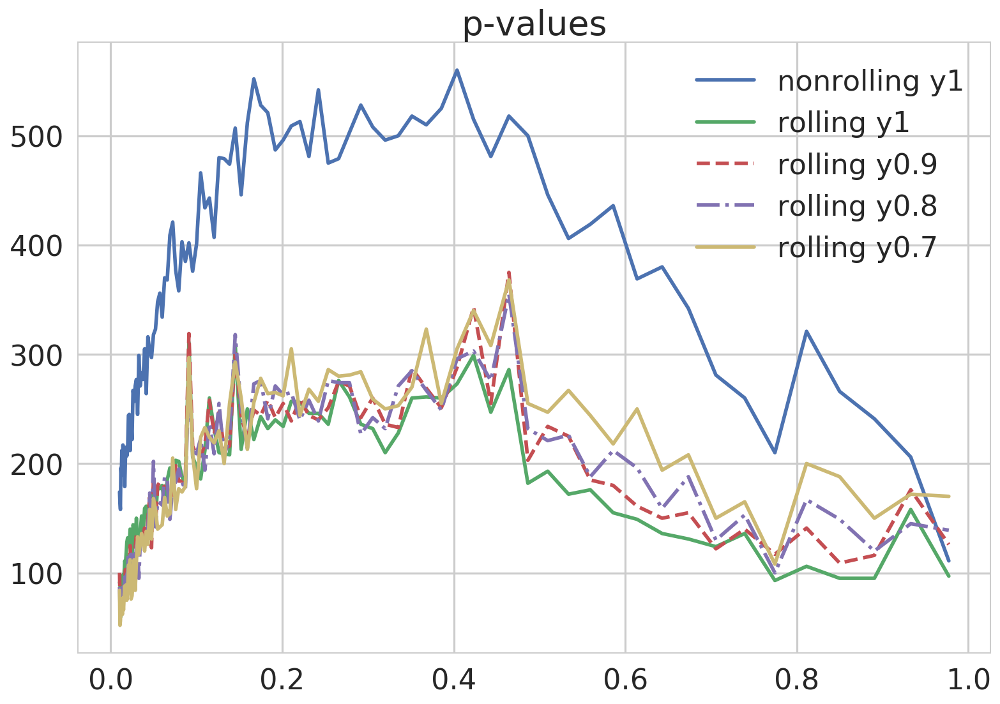

In [11]:
Dstathist(feat_hist_y1, label='nonrolling y1')
Dstathist(feat_hist_y1rolling, label='rolling y1')
Dstathist(feat_hist_y09rolling, label='rolling y0.9', linestyle='--')
Dstathist(feat_hist_08rolling, label='rolling y0.8', linestyle='-.')
Dstathist(feat_hist_07rolling, label='rolling y0.7')


#plt.xscale('log')
#plt.yscale('log')
plt.title('p-values')
plt.legend()

In [9]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


/global/common/software/lsst/common/miniconda/py3-4.2.12/lib/python3.6/site-packages/IPython/core/magics/pylab.py:160: UserWarning: pylab import has clobbered these variables: ['uniform']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


In [14]:
test_positions.copy()

{'lon2, lat2': (array([ 0.50205501,  0.48520698,  0.50860516,  0.50477108,  0.49533745,
          0.50094977,  0.49035232,  0.51750916,  0.50380949,  0.51861579,
          0.49397877,  0.50162288,  0.50926529,  0.49834429,  0.49915256,
          0.49359102,  0.48751728,  0.47525898,  0.48999523,  0.48922553,
          0.52770456,  0.5253684 ,  0.52732914,  0.53183558]),
  array([-0.11998878, -0.15054995, -0.14108768, -0.14583788, -0.14897062,
         -0.1212338 , -0.15799074, -0.14948063, -0.14887293, -0.13073101,
         -0.14889117, -0.14600304, -0.12853572, -0.13622702, -0.1421644 ,
         -0.1435405 , -0.12564228, -0.12852142, -0.11298885, -0.12406227,
         -0.14102453, -0.12903846, -0.12310406, -0.13123903])),
 'slicepoint': (0.50314569842649026, -0.13057909898125541)}

In [19]:

outDir='temp'
conn = db.OpsimDatabaseV4('simruns/alt_sched.db')
resultsDb = db.ResultsDb(outDir=outDir)

bundleList = []
sql = 'filter = "r" and night < 365 \
and fieldRA < {} and fieldDec > {} \
and fieldRA > 0 and fieldDec < 0 and proposalId = 0'.format(200,-50)
metric = AngleDist2PointingCenter(latCol='fieldDec', lonCol='fieldRA')
slicer = slicers.HealpixSlicer(nside=128)
bundleList.append(metricBundles.MetricBundle(metric, slicer, sql))
bd = metricBundles.makeBundlesDictFromList(bundleList)
mbg = metricBundles.MetricBundleGroup(bd, conn, outDir=outDir)
mbg.runAll()
conn.close()

results_bundle = bd['opsim_Pointing_Center_Distribution_r_and_night_lt_365_and_fieldRA_lt_200_and_fieldDec_gt_-50_and_fieldRA_gt_0_and_fieldDec_lt_0_and_proposalId_0_HEAL']

alt_hist_y1 = results_bundle.metricValues.data[np.where(results_bundle.metricValues.mask==False)]

outDir='temp'
conn = db.OpsimDatabaseV4('simruns/alt_sched_rolling.db')
resultsDb = db.ResultsDb(outDir=outDir)

bundleList = []
sql = 'filter = "r" and night < 365 \
and fieldRA < {} and fieldDec > {} \
and fieldRA > 0 and fieldDec < 0 and proposalId = 0'.format(200,-50)
metric = AngleDist2PointingCenter(latCol='fieldDec', lonCol='fieldRA')
slicer = slicers.HealpixSlicer(nside=128)
bundleList.append(metricBundles.MetricBundle(metric, slicer, sql))
bd = metricBundles.makeBundlesDictFromList(bundleList)
mbg = metricBundles.MetricBundleGroup(bd, conn, outDir=outDir)
mbg.runAll()
conn.close()

results_bundle = bd['opsim_Pointing_Center_Distribution_r_and_night_lt_365_and_fieldRA_lt_200_and_fieldDec_gt_-50_and_fieldRA_gt_0_and_fieldDec_lt_0_and_proposalId_0_HEAL']

alt_hist_y1rolling = results_bundle.metricValues.data[np.where(results_bundle.metricValues.mask==False)]

outDir='temp'
conn = db.OpsimDatabaseV4('simruns/alt_sched_rolling.db')
resultsDb = db.ResultsDb(outDir=outDir)

bundleList = []
sql = 'filter = "r" and night < 330 \
and fieldRA < {} and fieldDec > {} \
and fieldRA > 0 and fieldDec < 0 and proposalId = 0'.format(200,-50)
metric = AngleDist2PointingCenter(latCol='fieldDec', lonCol='fieldRA')
slicer = slicers.HealpixSlicer(nside=128)
bundleList.append(metricBundles.MetricBundle(metric, slicer, sql))
bd = metricBundles.makeBundlesDictFromList(bundleList)
mbg = metricBundles.MetricBundleGroup(bd, conn, outDir=outDir)
mbg.runAll()
conn.close()

results_bundle = bd['opsim_Pointing_Center_Distribution_r_and_night_lt_330_and_fieldRA_lt_200_and_fieldDec_gt_-50_and_fieldRA_gt_0_and_fieldDec_lt_0_and_proposalId_0_HEAL']

alt_hist_y09rolling = results_bundle.metricValues.data[np.where(results_bundle.metricValues.mask==False)]

outDir='temp'
conn = db.OpsimDatabaseV4('simruns/alt_sched_rolling.db')
resultsDb = db.ResultsDb(outDir=outDir)

bundleList = []
sql = 'filter = "r" and night < 300 \
and fieldRA < {} and fieldDec > {} \
and fieldRA > 0 and fieldDec < 0 and proposalId = 0'.format(200,-50)
metric = AngleDist2PointingCenter(latCol='fieldDec', lonCol='fieldRA')
slicer = slicers.HealpixSlicer(nside=128)
bundleList.append(metricBundles.MetricBundle(metric, slicer, sql))
bd = metricBundles.makeBundlesDictFromList(bundleList)
mbg = metricBundles.MetricBundleGroup(bd, conn, outDir=outDir)
mbg.runAll()
conn.close()

results_bundle = bd['opsim_Pointing_Center_Distribution_r_and_night_lt_300_and_fieldRA_lt_200_and_fieldDec_gt_-50_and_fieldRA_gt_0_and_fieldDec_lt_0_and_proposalId_0_HEAL']

alt_hist_08rolling = results_bundle.metricValues.data[np.where(results_bundle.metricValues.mask==False)]

outDir='temp'
conn = db.OpsimDatabaseV4('simruns/alt_sched_rolling.db')
resultsDb = db.ResultsDb(outDir=outDir)

bundleList = []
sql = 'filter = "r" and night < 270 \
and fieldRA < {} and fieldDec > {} \
and fieldRA > 0 and fieldDec < 0 and proposalId = 0'.format(200,-50)
metric = AngleDist2PointingCenter(latCol='fieldDec', lonCol='fieldRA')
slicer = slicers.HealpixSlicer(nside=128)
bundleList.append(metricBundles.MetricBundle(metric, slicer, sql))
bd = metricBundles.makeBundlesDictFromList(bundleList)
mbg = metricBundles.MetricBundleGroup(bd, conn, outDir=outDir)
mbg.runAll()
conn.close()

results_bundle = bd['opsim_Pointing_Center_Distribution_r_and_night_lt_270_and_fieldRA_lt_200_and_fieldDec_gt_-50_and_fieldRA_gt_0_and_fieldDec_lt_0_and_proposalId_0_HEAL']

alt_hist_07rolling = results_bundle.metricValues.data[np.where(results_bundle.metricValues.mask==False)]

Healpix slicer using NSIDE=128, approximate resolution 27.483891 arcminutes
Querying database SummaryAllProps with constraint filter = "r" and night < 365 and fieldRA < 200 and fieldDec > -50 and fieldRA > 0 and fieldDec < 0 and proposalId = 0 for columns ['fieldDec', 'fieldRA']
Found 25512 visits
Running:  ['opsim_Pointing_Center_Distribution_r_and_night_lt_365_and_fieldRA_lt_200_and_fieldDec_gt_-50_and_fieldRA_gt_0_and_fieldDec_lt_0_and_proposalId_0_HEAL']


/global/u2/h/husni/newcontrib/sims_maf/python/lsst/sims/maf/metricBundles/metricBundleGroup.py:446: RuntimeWarning: invalid value encountered in equal
  b.metricValues.mask = np.where(b.metricValues.data == b.metric.badval,


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Healpix slicer using NSIDE=128, approximate resolution 27.483891 arcminutes
Querying database SummaryAllProps with constraint filter = "r" and night < 365 and fieldRA < 200 and fieldDec > -50 and fieldRA > 0 and fieldDec < 0 and proposalId = 0 for columns ['fieldDec', 'fieldRA']
Found 26626 visits
Running:  ['opsim_Pointing_Center_Distribution_r_and_night_lt_365_and_fieldRA_lt_200_and_fieldDec_gt_-50_and_fieldRA_gt_0_and_fieldDec_lt_0_and_proposalId_0_HEAL']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Healpix slicer using NSIDE=128, approximate resolution 27.483891 arcminutes
Querying database SummaryAllProps with constraint filter = "r" and night < 330 and fieldRA < 200 and fieldDec > -50 and fieldRA > 0 and fieldDec < 0 and proposalId = 0 for columns ['fieldDec', 'fieldRA']
Found 22526 visits
Running:  ['opsim_Pointing_Center_Distribution_r_and_n

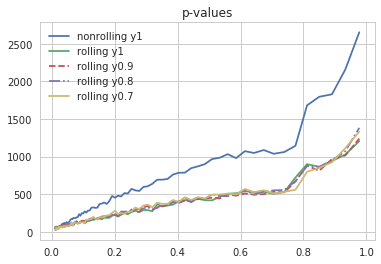

In [20]:
Dstathist(alt_hist_y1, label='nonrolling y1')
Dstathist(alt_hist_y1rolling, label='rolling y1')
Dstathist(alt_hist_y09rolling, label='rolling y0.9', linestyle='--')
Dstathist(alt_hist_08rolling, label='rolling y0.8', linestyle='-.')
Dstathist(alt_hist_07rolling, label='rolling y0.7')


#plt.xscale('log')
#plt.yscale('log')
plt.title('p-values')
plt.legend()

## Airmass

In [43]:
outDir='temp'
conn = db.OpsimDatabaseV4('simruns/feature_baseline_10yrs.db')
bundleList = []
sql = 'filter = "r" and proposalId = 0 and airmass>0'
metric = metrics.CountMetric('airmass')
slicer = slicers.HealpixSlicer()
#dith_stack = stackers.NormAirmassStacker()
bundleList.append(metricBundles.MetricBundle(metric, slicer, sql))#, stackerList=[dith_stack]))
bd = metricBundles.makeBundlesDictFromList(bundleList)
mbg = metricBundles.MetricBundleGroup(bd, conn, outDir=outDir, saveEarly= False)
mbg.runAll()
conn.close()


Healpix slicer using NSIDE=128, approximate resolution 27.483891 arcminutes
Querying database SummaryAllProps with constraint filter = "r" and proposalId = 0 and airmass>0 for columns ['fieldRA', 'fieldDec', 'airmass']
Found 503803 visits
Running:  ['opsim_Count_airmass_r_and_proposalId_0_and_airmassgt0_HEAL']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.


In [45]:
num, xedges, yedges = np.histogram2d(mbg.simData['fieldRA'], mbg.simData['fieldDec'], bins=15)

/global/common/software/lsst/common/miniconda/py3-4.2.12/lib/python3.6/site-packages/ipykernel/__main__.py:3: RuntimeWarning: invalid value encountered in true_divide
  app.launch_new_instance()


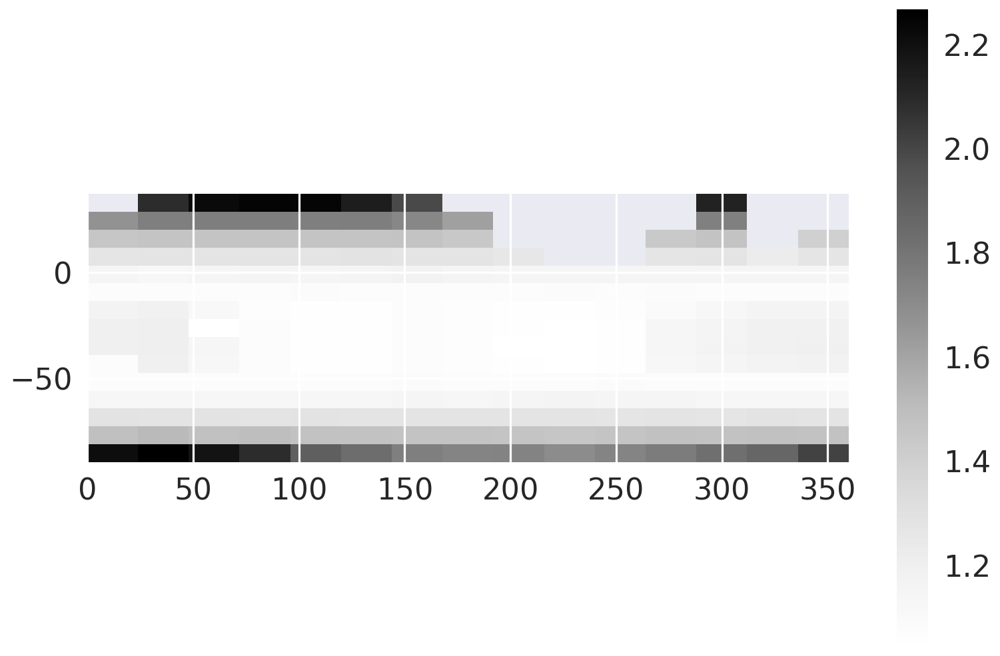

In [46]:
H, xedges, yedges = np.histogram2d(mbg.simData['fieldRA'], mbg.simData['fieldDec'], weights=mbg.simData['airmass'], bins=15)
H = H.T
plt.imshow(H/num.T, interpolation='cubic', origin='low', extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]])
plt.colorbar()

- query the database for filter, dec, airmass
- for each filter: plot distribution of airmasses histogram overall
- for each filter: for each declination band: plot airmass histogram



In [5]:
outDir='temp'
conn = db.OpsimDatabaseV4('simruns/feature_baseline_10yrs.db')
bundleList = []
sql = 'proposalId = 0 and airmass>0'
metric = metrics.CountMetric('filter')
slicer = slicers.HealpixSlicer()
dith_stack = stackers.NormAirmassStacker()
bundleList.append(metricBundles.MetricBundle(metric, slicer, sql, stackerList=[dith_stack]))
bd = metricBundles.makeBundlesDictFromList(bundleList)
mbg = metricBundles.MetricBundleGroup(bd, conn, outDir=outDir, saveEarly= False)
mbg.runAll()
conn.close()

Healpix slicer using NSIDE=128, approximate resolution 27.483891 arcminutes
Querying database SummaryAllProps with constraint proposalId = 0 and airmass>0 for columns ['filter', 'fieldDec', 'fieldRA', 'airmass']
Found 2304791 visits
Running:  ['opsim_Count_filter_proposalId_0_and_airmassgt0_HEAL']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.


In [6]:
filter_data = mbg.simData['filter']
dec_data = mbg.simData['fieldDec']
airmass_data = mbg.simData['airmass']

In [8]:
from collections import namedtuple
ks_tuple = namedtuple('ks_tuple', ['Dstatistic', 'pvalue'])

In [27]:
airmass_dict

{'g': array([ 1.02613733,  1.02633681,  1.0265432 , ...,  1.02827005,
         1.02853442,  1.02880578]),
 'i': array([ 1.0296552 ,  1.02995187,  1.03025558, ...,  1.0046699 ,
         1.12268929,  1.02213133]),
 'r': array([ 1.01215033,  1.02620798,  1.04754492, ...,  1.02541694,
         1.02558466,  1.02575926]),
 'u': array([ 1.03800929,  1.029833  ,  1.00971031, ...,  1.04974428,
         1.03118304,  1.03124663]),
 'y': array([ 1.00271062,  1.00788483,  1.00649113, ...,  1.00547391,
         1.0130752 ,  1.00717443]),
 'z': array([ 1.02276864,  1.04679429,  1.06359835, ...,  1.18491219,
         1.23086986,  1.2873612 ])}

In [29]:
ks_stats_dict

{'g': ks_tuple(Dstatistic=0.20714031375570816, pvalue=0.0),
 'i': ks_tuple(Dstatistic=0.18541485314157261, pvalue=0.0),
 'r': ks_tuple(Dstatistic=0.22171876993963491, pvalue=0.0),
 'u': ks_tuple(Dstatistic=0.65724387292811037, pvalue=0.0),
 'y': ks_tuple(Dstatistic=0.48483226510002114, pvalue=0.0),
 'z': ks_tuple(Dstatistic=0.16210620405372311, pvalue=0.0)}

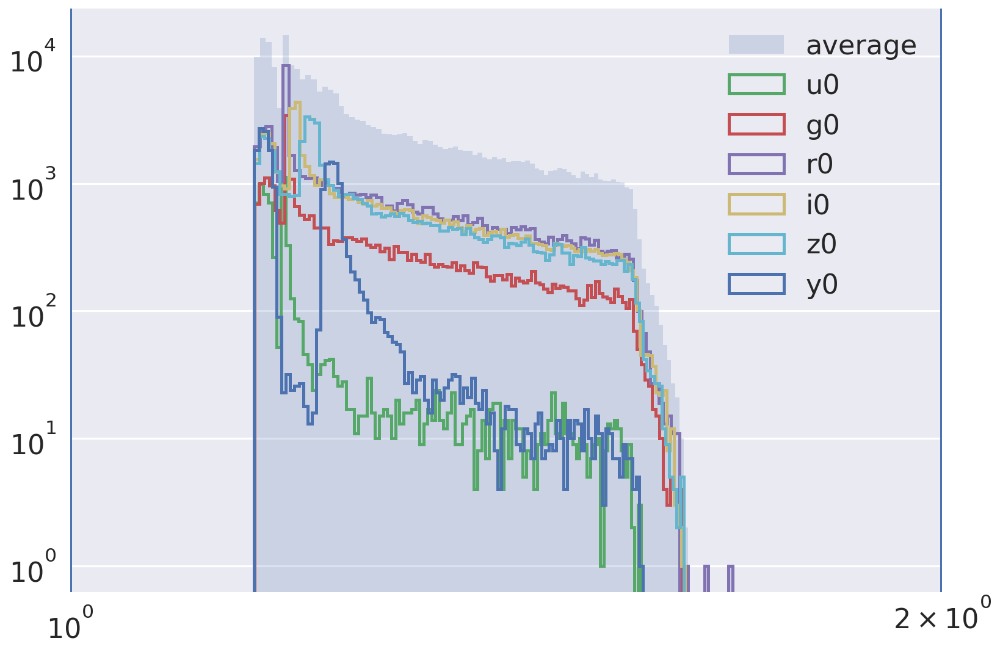

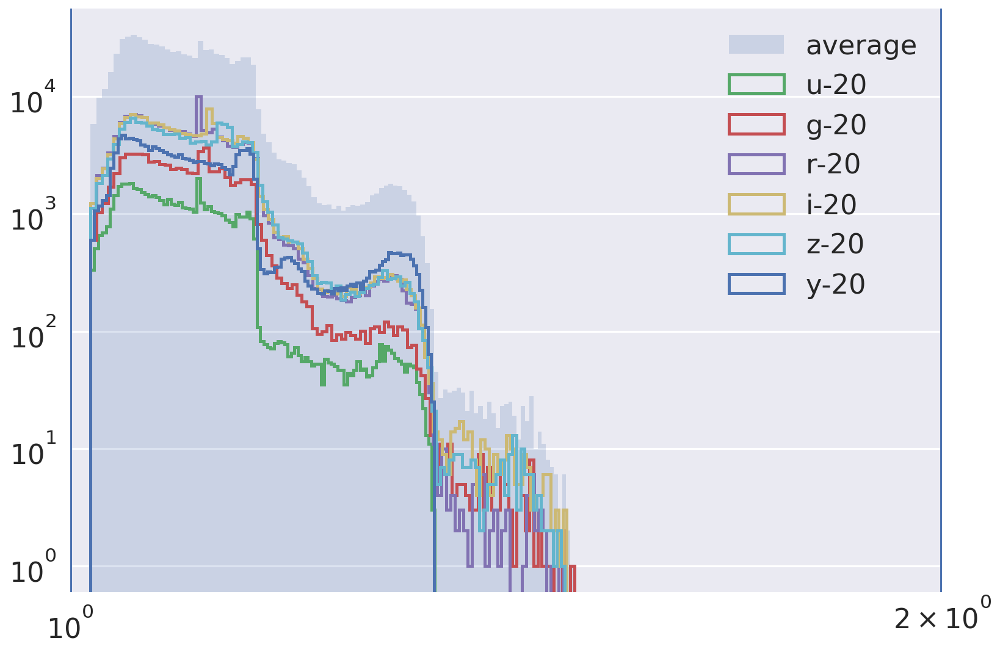

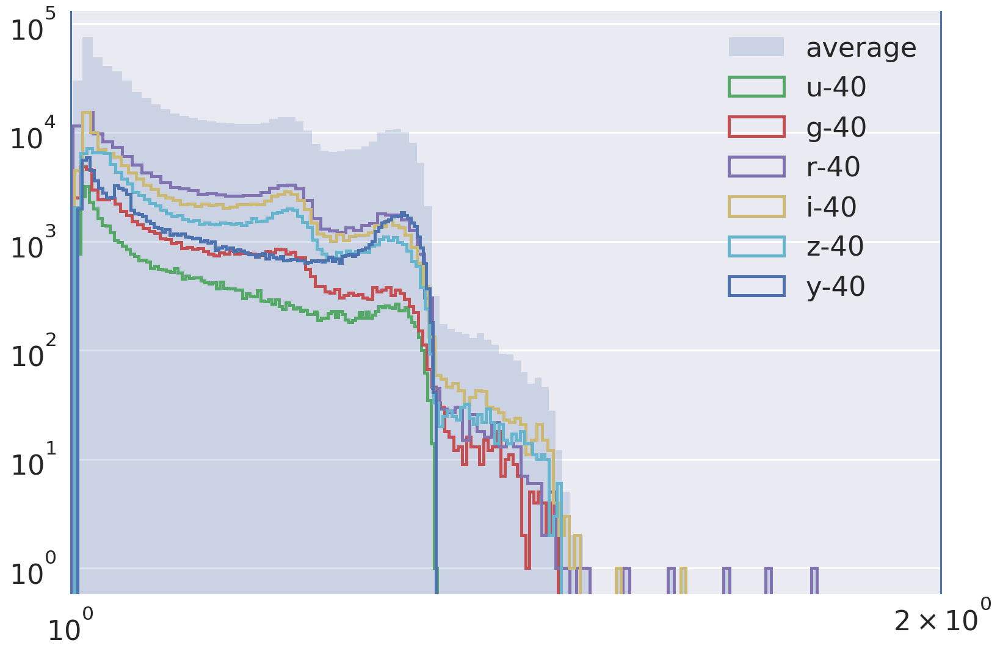

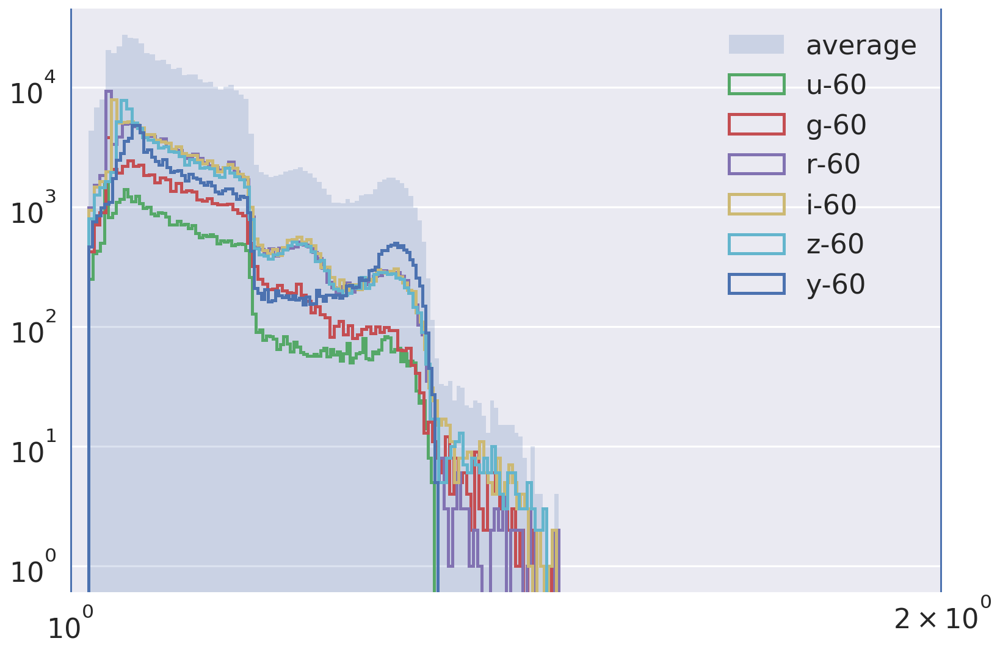

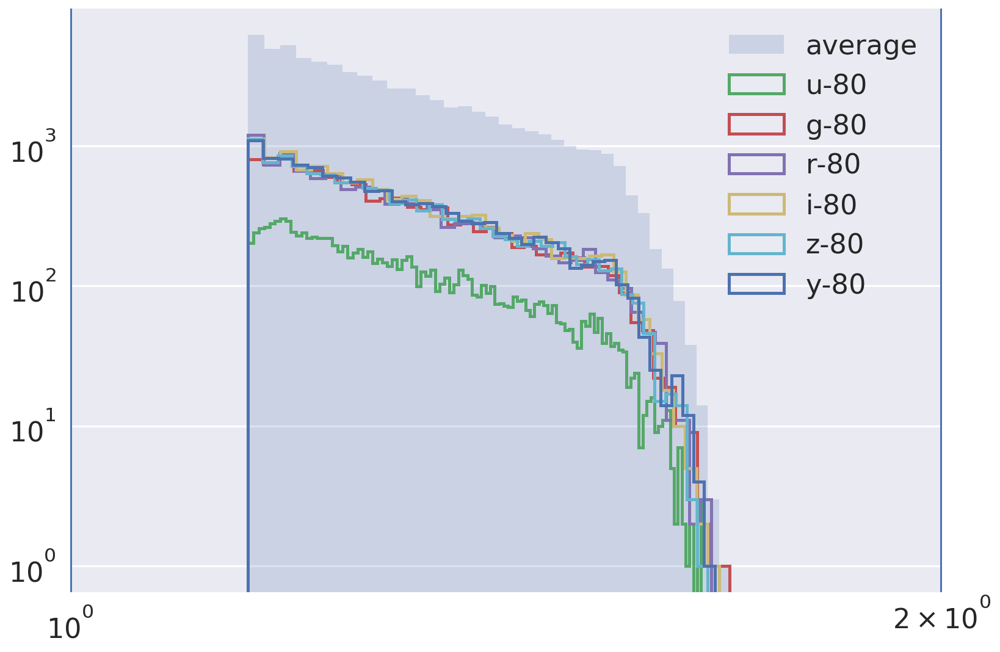

In [15]:
norm_airmass = airmass_data/min(airmass_data)
filters = ['u','g','r','i','z','y']
ks_stats_dict = {k:[] for k in filters}
airmass_dict = {k:[] for k in filters}
for dec_band, dec_band_next in zip([0,-20,-40,-60,-80],[20,0,-20,-40,-60]):
    airmass_per_dec_band = airmass_data[np.logical_and(dec_data>dec_band, dec_data<dec_band_next)]
    plt.hist(airmass_per_dec_band, label='average', alpha=0.2, bins=100)
    for filt in filters:
        
        plt.axvline(2)
        plt.axvline(1)
        filtered_airmass = airmass_data[np.logical_and(np.logical_and(filter_data==filt,dec_data>dec_band),dec_data<dec_band_next)]
        #filtered_airmass /= min(filtered_airmass)
        plt.hist(filtered_airmass, label=filt+str(dec_band), histtype='step', linewidth=2.5, bins=100)
        airmass_dict[filt].append(filtered_airmass)
        ks_test = stats.ks_2samp(filtered_airmass, airmass_per_dec_band)
        ks_stats_dict[filt].append(ks_tuple(Dstatistic=ks_test.statistic, pvalue=ks_test.pvalue))
    plt.legend()
    plt.xscale('log')
    plt.xlim(0,2)
    plt.yscale('log')
    plt.figure()


In [10]:
ks_stats_dict

{'g': [ks_tuple(Dstatistic=0.076821816859273417, pvalue=4.7609785975236618e-132),
  ks_tuple(Dstatistic=0.02394115553117393, pvalue=2.829422407429593e-35),
  ks_tuple(Dstatistic=0.056123521972030299, pvalue=1.536692008837131e-167),
  ks_tuple(Dstatistic=0.041697427576746965, pvalue=7.6432177949040189e-70),
  ks_tuple(Dstatistic=0.01621183602423984, pvalue=0.015361117314917841)],
 'i': [ks_tuple(Dstatistic=0.087179802797003825, pvalue=3.6978717764747645e-316),
  ks_tuple(Dstatistic=0.015700486499911515, pvalue=2.1048872400907122e-29),
  ks_tuple(Dstatistic=0.020980105539505578, pvalue=2.2177470434284379e-45),
  ks_tuple(Dstatistic=0.022769910887165276, pvalue=3.4335872498419563e-40),
  ks_tuple(Dstatistic=0.010159682013972965, pvalue=0.26826475198189653)],
 'r': [ks_tuple(Dstatistic=0.044813856934919238, pvalue=1.0888556450272624e-83),
  ks_tuple(Dstatistic=0.028616430498349055, pvalue=1.6910910084100235e-96),
  ks_tuple(Dstatistic=0.036490582834742866, pvalue=8.5550371375842904e-136),


## Moon Visibility

In [3]:
moonperfilter = {}
for colorfilter in ['u', 'g', 'r', 'i', 'z', 'y']:
    outDir='temp'
    conn = db.OpsimDatabase('simruns/minion_1012_sqlite.db')
    bundleList = []
    sql = 'filter = "'+colorfilter+'"'
    metric = metrics.CountMetric('moonAlt')
    slicer = slicers.HealpixSlicer()
    bundleList.append(metricBundles.MetricBundle(metric, slicer, sql))
    bd = metricBundles.makeBundlesDictFromList(bundleList)
    mbg = metricBundles.MetricBundleGroup(bd, conn, outDir=outDir, saveEarly= False)
    mbg.runAll()
    conn.close()
    moonperfilter[colorfilter] = mbg.simData['moonAlt']

Healpix slicer using NSIDE=128, approximate resolution 27.483891 arcminutes
Querying database Summary with constraint filter = "u" for columns ['moonAlt', 'fieldDec', 'fieldRA']
Found 164579 visits
Running:  ['opsim_Count_moonAlt_u_HEAL']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Healpix slicer using NSIDE=128, approximate resolution 27.483891 arcminutes
Querying database Summary with constraint filter = "g" for columns ['moonAlt', 'fieldDec', 'fieldRA']
Found 234200 visits
Running:  ['opsim_Count_moonAlt_g_HEAL']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Healpix slicer using NSIDE=128, approximate resolution 27.483891 arcminutes
Querying database Summary with constraint filter = "r" for columns ['moonAlt', 'fieldDec', 'fieldRA']
Found 530627 visits
Running:  ['opsim_Count_moonAlt_r_HEAL']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Healpix

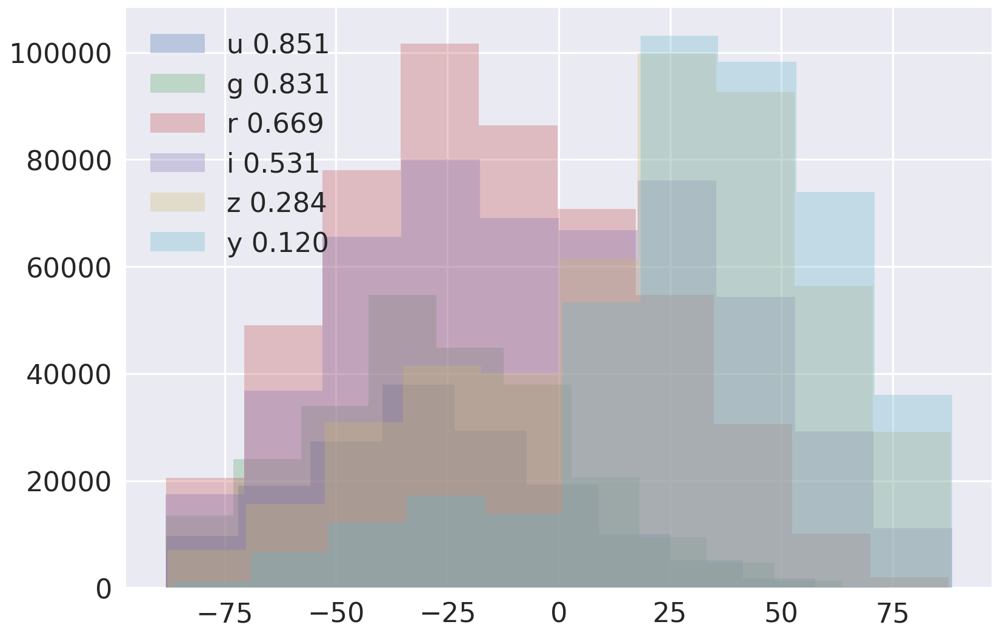

In [69]:
for colorfilter in moonperfilter.keys():
    m = 0
    for i in moonperfilter[colorfilter]:
        if i<0:
            m+=1
    plt.hist(moonperfilter[colorfilter], label=colorfilter+' {:.3f}'.format(m/len(moonperfilter[colorfilter])),alpha=0.3)#, histtype='step')
plt.legend()

- query the database for moon_alt, ra, dec
- for each ra, dec, if moonAlt>0: dict[(ra,dec)]+=1
- plot weighted 2d histogram

In [17]:
conn.columnNames

{'Cloud': ['cloudID', 'c_date', 'cloud'],
 'Config': ['configID',
  'moduleName',
  'paramIndex',
  'paramName',
  'paramValue',
  'comment',
  'Session_sessionID',
  'nonPropID'],
 'Config_File': ['config_fileID', 'filename', 'data', 'Session_sessionID'],
 'Field': ['fieldID',
  'fieldFov',
  'fieldRA',
  'fieldDec',
  'fieldGL',
  'fieldGB',
  'fieldEL',
  'fieldEB'],
 'Log': ['logID', 'log_name', 'log_value', 'Session_sessionID'],
 'MissedHistory': ['missedHistID',
  'Session_sessionID',
  'filter',
  'expDate',
  'expMJD',
  'night',
  'lst',
  'Field_fieldID'],
 'ObsHistory': ['obsHistID',
  'Session_sessionID',
  'filter',
  'expDate',
  'expMJD',
  'night',
  'visitTime',
  'visitExpTime',
  'finRank',
  'finSeeing',
  'transparency',
  'airmass',
  'vSkyBright',
  'filtSkyBrightness',
  'rotSkyPos',
  'lst',
  'altitude',
  'azimuth',
  'dist2Moon',
  'solarElong',
  'moonRA',
  'moonDec',
  'moonAlt',
  'moonAZ',
  'moonPhase',
  'sunAlt',
  'sunAZ',
  'phaseAngle',
  'rScatte

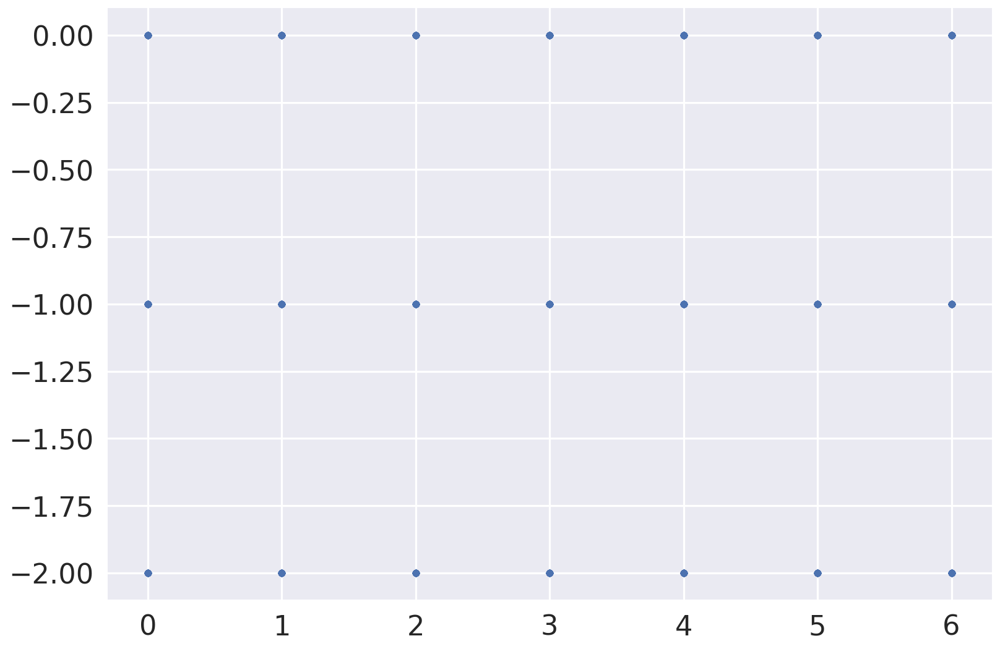

In [16]:
plt.plot(fieldRA,fieldDec, '.')

In [2]:
outDir='temp'
conn = db.OpsimDatabase('simruns/minion_1012_sqlite.db')
bundleList = []
sql = ''
metric = metrics.PassMetric(('moonAlt', 'filter'))
slicer = slicers.HealpixSlicer(latLonDeg=False)
dith_stack = stackers.NormAirmassStacker(degrees=False)
bundleList.append(metricBundles.MetricBundle(metric, slicer, sql))#, stackerList=[dith_stack]))
bd = metricBundles.makeBundlesDictFromList(bundleList)
mbg = metricBundles.MetricBundleGroup(bd, conn, outDir=outDir, saveEarly= False)
mbg.runAll()
conn.close()

Healpix slicer using NSIDE=128, approximate resolution 27.483891 arcminutes
Querying database Summary with no constraint for columns ['filter', 'fieldDec', 'fieldRA', 'moonAlt'].
Found 2421933 visits
Running:  ['opsim_Pass_moonAlt_filter_HEAL']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.


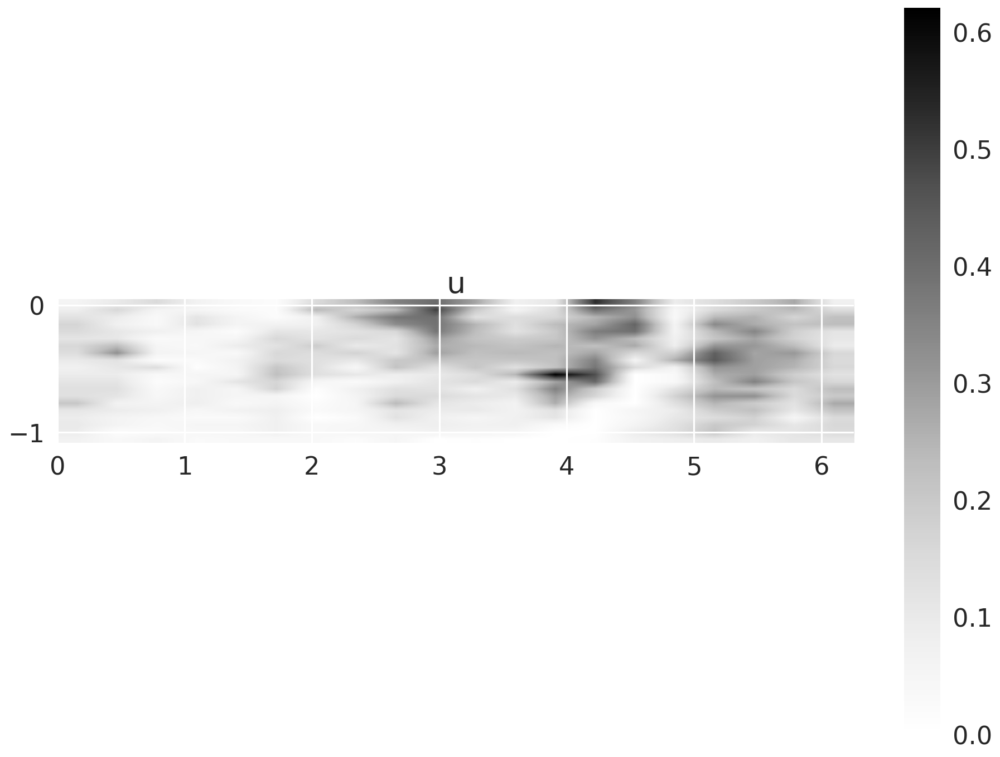

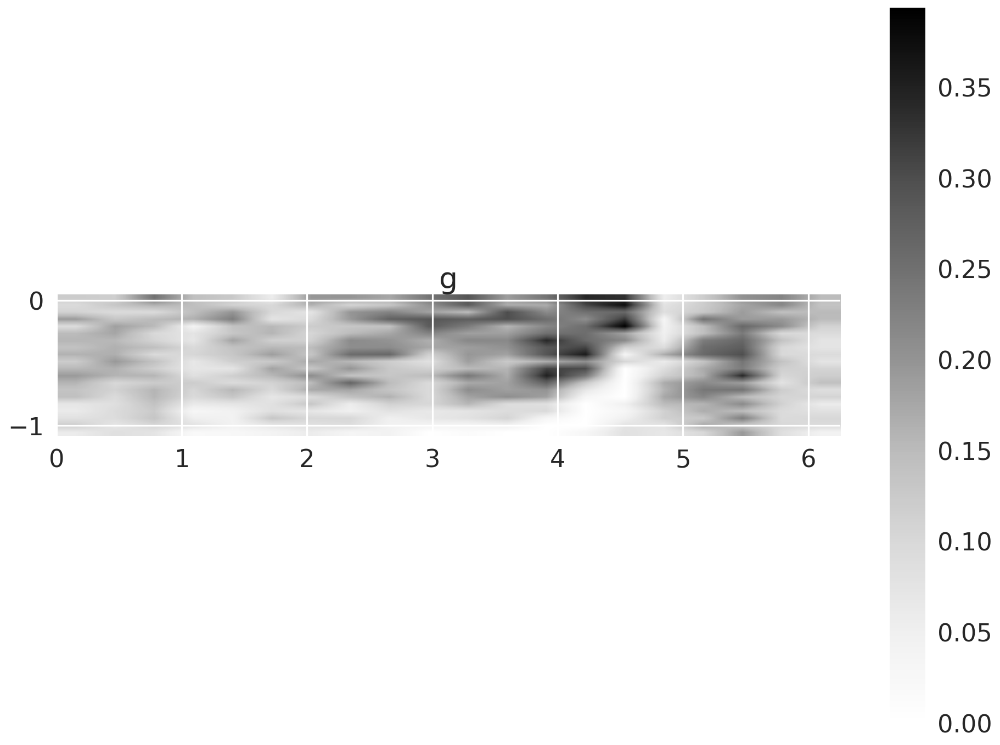

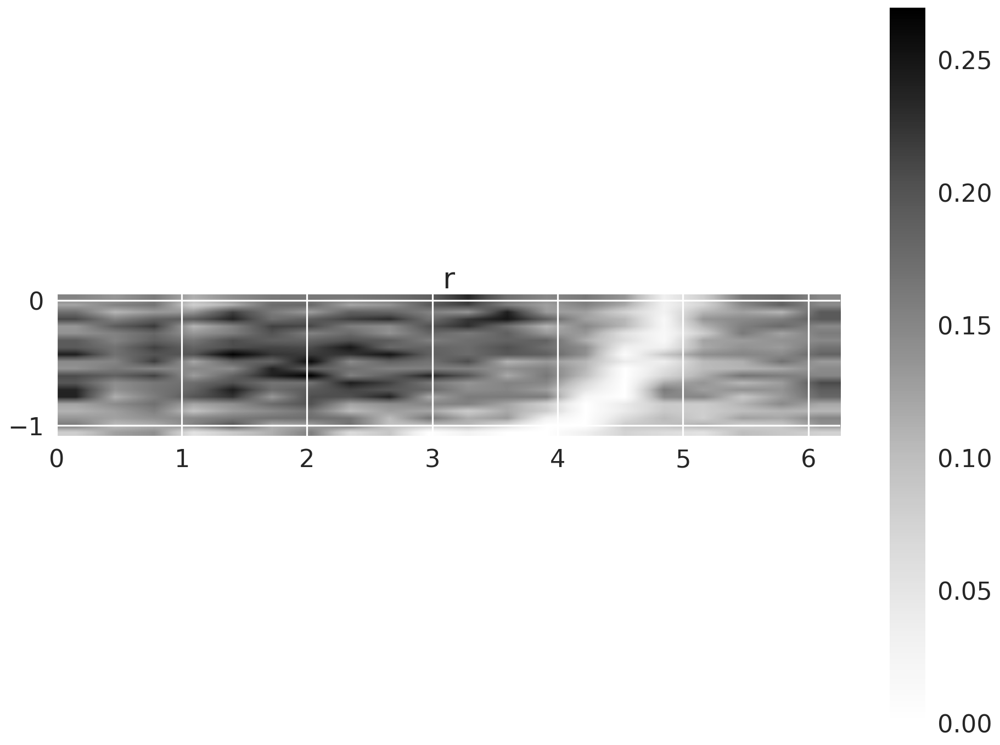

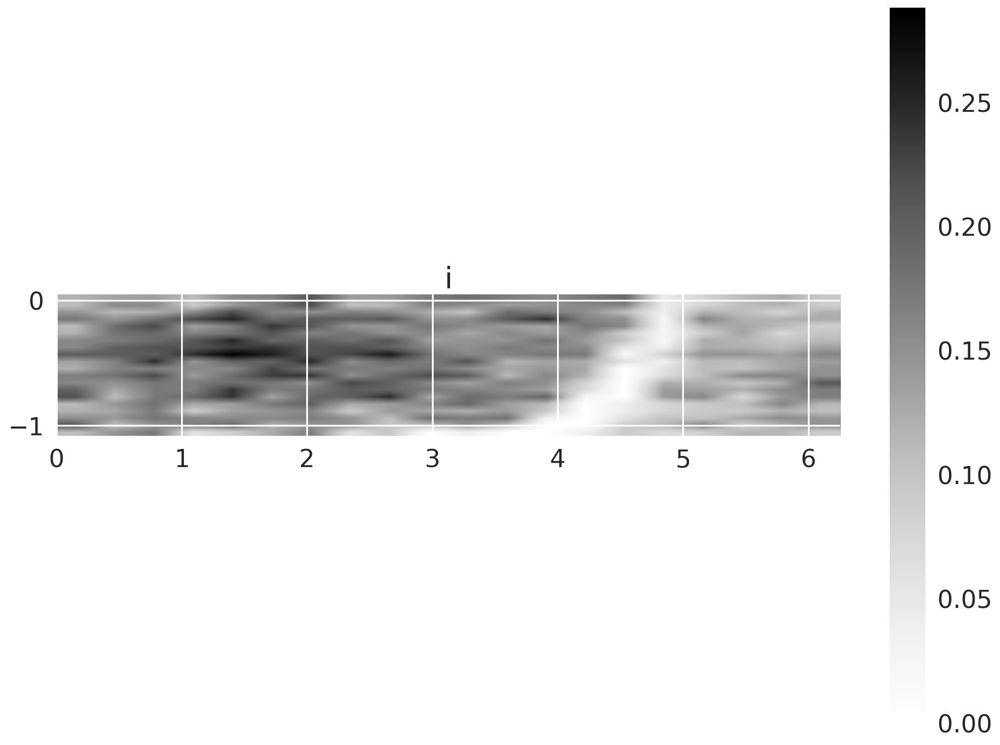

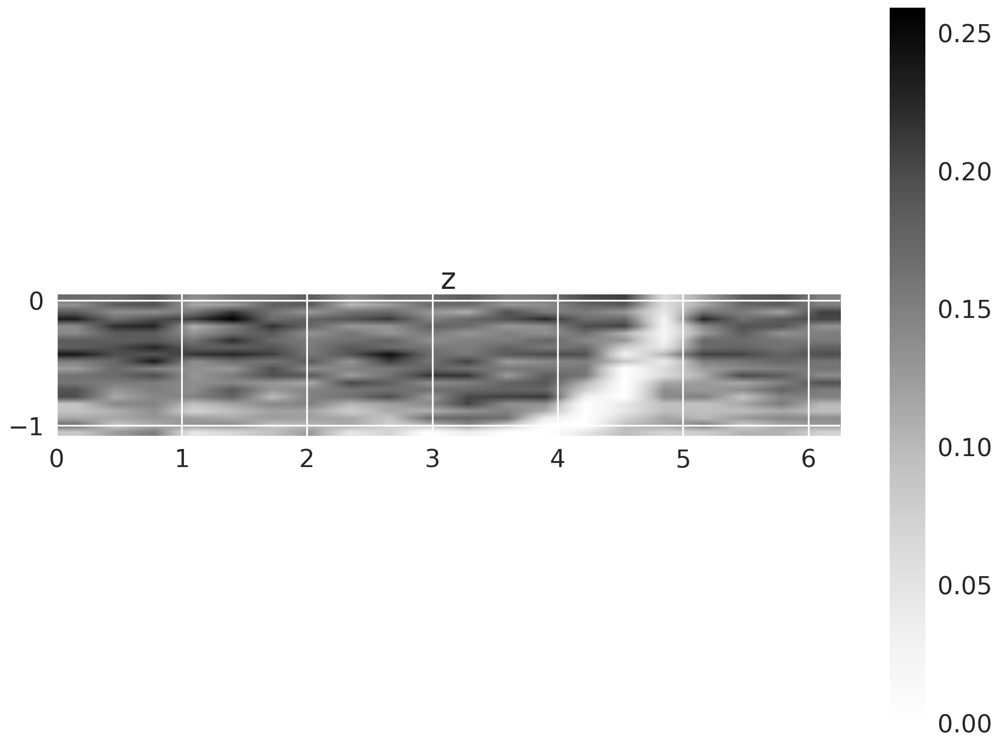

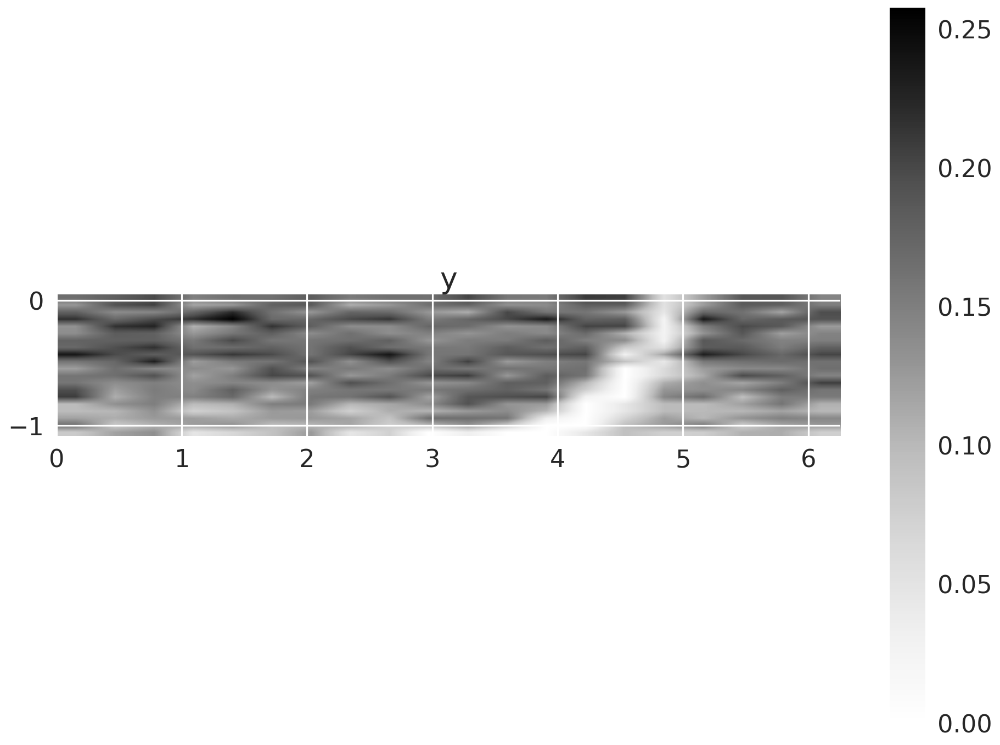

In [110]:
minion_corrs_per_filter = {}
from collections import namedtuple
filters = ['u','g','r','i','z','y']
moon_tuple = namedtuple('moon_tuple', ['visible', 'nonvisible'])
moon_dict = {k:[moon_tuple(0,0)] for k in filters}
filter_data = mbg.simData['filter']
moonAlt = np.array([0 if i<0 else 1 for i in mbg.simData['moonAlt']])
fieldRA = mbg.simData['fieldRA']
fieldDec = mbg.simData['fieldDec']
for filt in ['u','g','r','i','z','y']:
    plt.figure(figsize=(16,12))
    plt.title(filt)
    hist = np.histogram2d(fieldRA[filter_data==filt], fieldDec[filter_data==filt], weights=moonAlt[filter_data==filt],
                          normed=True, bins=20)
    H, xedges, yedges = hist
    H = H.T
    X = np.array(list(hist[1])*10)
    Y = np.array([[i]*10 for i in hist[2]]).flatten()
    Cat = treecorr.Catalog(k=H.flatten(), ra=X, dec=Y, ra_units='radians', dec_units='radians')
    min_sep = 0.5
    nbins = 20
    max_sep = 50
    Corr = treecorr.KKCorrelation(min_sep=min_sep, max_sep=max_sep, nbins=nbins, sep_units='degrees')
    Corr.process(Cat)
    minion_corrs_per_filter[filt] = Corr
    plt.imshow(H, interpolation='bilinear', origin='low',
         extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]])
#    plt.hist2d(fieldRA[filter_data==filt], fieldDec[filter_data==filt], weights=moonAlt[filter_data==filt], bins=20);
    plt.colorbar()
#    print(maxlim)
#    plt.clim(-100,100)
    plt.show()


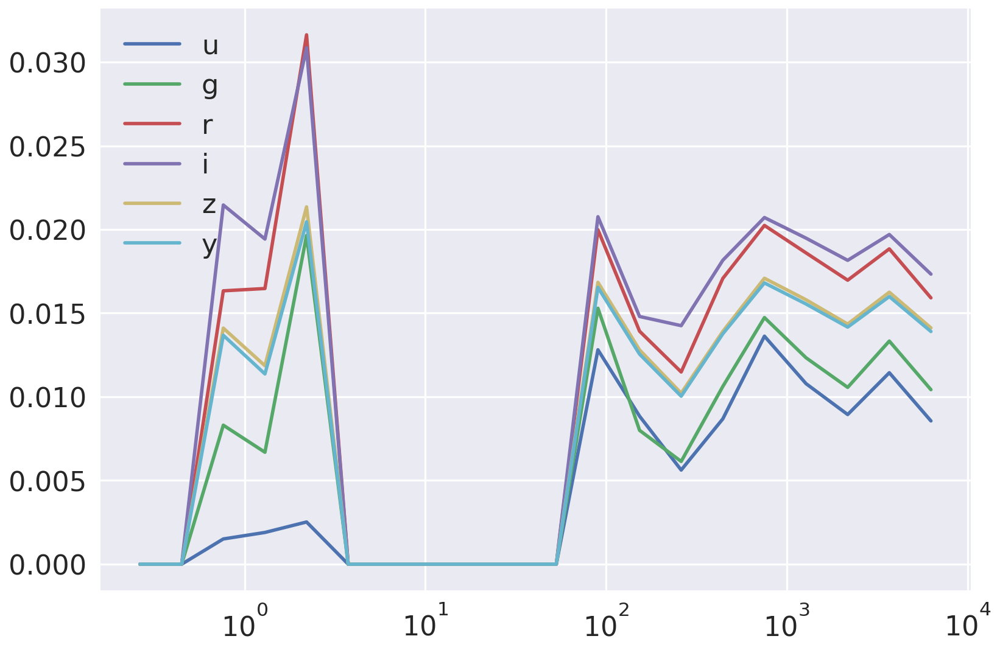

In [108]:
for filt in filters:
    corr = corrs_per_filter[filt]
    plt.plot(10**corr.logr, corr.xi, label=filt)
    plt.xscale('log')
    plt.legend()
